In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import xlrd as xl
%matplotlib inline
#plt.rcParams['figure.figsize'] = [20, 15]#graph size
#plt.style.use("home/alejandro/Imágenes/presentation.mplstyle")

In [2]:
params={'figure.figsize':(30,15),
            'legend.fontsize':20,
            'axes.labelsize':16,
            'axes.titlesize':20,
            'xtick.labelsize':14,
            'ytick.labelsize':14,
            'legend.title_fontsize':20}
plt.rcParams.update(params)

In [3]:
Cab_data=pd.read_csv("Cab_Data.csv")
City=pd.read_csv("City.csv")
Customer_ID=pd.read_csv("Customer_ID.csv")
Transaction_ID=pd.read_csv("Transaction_ID.csv")
dictionary_of_DF={"Cab_data":Cab_data,"City":City,"Customer_ID":Customer_ID,"Transaction_ID":Transaction_ID}
#print([df.shape for keys,df in dictionary_of_DF.items()])

#### City:

City: Here simply mentions the city of the user where the travel takes place.

Users: total cab users in the city

Population:Total population in the City

#### Cab_Data:

Transaction_ID: The identity of the transaction

Date of travel: Date where it takes place, written in serial excel.

Company: in which company it was realized

City: the same as the previous case

Km travelled: the distance of the travesy

price charged: How much the client paid

cost trip: How much it cost the company the travel

#### Customer ID: 

Here we recieve info about the client: gender age and salary.

#### Transaction_ID: 

Here we can see who paid for each travel and how it paid for it.

In [4]:
def list_clean(Dict_dataframes):
    list_def_cleaning={}
    for keys,values in Dict_dataframes.items():
        list_def_cleaning[keys]=values.dtypes
    return pd.DataFrame(list_def_cleaning)
list_clean(dictionary_of_DF)

,Cab_data,City,Customer_ID,Transaction_ID
Age,NaN,NaN,int64,NaN
City,object,object,NaN,NaN
Company,object,NaN,NaN,NaN
Cost of Trip,float64,NaN,NaN,NaN
Customer ID,NaN,NaN,int64,int64
Date of Travel,int64,NaN,NaN,NaN
Gender,NaN,NaN,object,NaN
Income (USD/Month),NaN,NaN,int64,NaN
KM Travelled,float64,NaN,NaN,NaN
Payment_Mode,NaN,NaN,NaN,object


In [5]:
def cleanDF(list_def_cleaning,text="type"):
    list_def_cleaning2={}
    for indexL in list(list_def_cleaning.index):
        for valueL in list_def_cleaning.loc[indexL].dropna():
            list_def_cleaning2[indexL]=valueL
    list_def_cleaning2=pd.DataFrame(list_def_cleaning2,index=list_def_cleaning.index).iloc[0]
    list_def_cleaning2=pd.DataFrame(list_def_cleaning2)
    list_def_cleaning2.columns=list_def_cleaning2.columns.str.replace(list_def_cleaning.index[0],text)
    return list_def_cleaning2
df_type=cleanDF(list_clean(dictionary_of_DF),"type")
df_type

,type
Age,int64
City,object
Company,object
Cost of Trip,float64
Customer ID,int64
Date of Travel,int64
Gender,object
Income (USD/Month),int64
KM Travelled,float64
Payment_Mode,object


I see that in all the columns are strings in the csv file City. Population and Users have to be changed to unsigned int.
First I remove the commas and then I change it to int.

In [6]:
City["Users"]=City['Users'].str.replace(",","")
City["Population"]=City["Population"].str.replace(",","")
City["Users"]=pd.to_numeric(City['Users'])
City["Population"]=pd.to_numeric(City["Population"])

Now it is time to modify the date value, it was written in serial excel, in which 1 is equal to 1^st of January of 1900. Every increment equals to a day. We will use the xlrd module to turn the date from int to date format

In [7]:
Date_out=[xl.xldate_as_datetime(Travel,0).date() for Travel in Cab_data["Date of Travel"]]
Date_out=pd.DataFrame(Date_out)
Cab_data["Period_date"]=Cab_data["Date of Travel"]
Cab_data["Date of Travel"]=Date_out

In [8]:
date_periods=pd.cut(Cab_data["Period_date"], bins=12,
                    labels=['1_2016', '2_2016','3_2016','4_2016', '1_2017',"2_2017","3_2017","4_2017",
                    "1_2018","2_2018","3_2018","4_2018"])
Cab_data["Period_date"]=date_periods

This Dataframe was created to detect the type of the colume it's maximum value and it's minimum. We will try to use a more descirptive process with pandas method describe.

In [9]:
number_of_NA={}
number_of_max={}
number_of_min={}
dictionary_of_DF={"Cab_data":Cab_data,"City":City,"Customer_ID":Customer_ID,"Transaction_ID":Transaction_ID}
for name,df in dictionary_of_DF.items():
    number_of_NA[name]=df.isna().sum().sum()
    number_of_max[name]=df.max()
    number_of_min[name]=df.min()
number_of_max=pd.DataFrame(number_of_max)
number_of_min=pd.DataFrame(number_of_min)

In [10]:
max_clean,min_clean=cleanDF(number_of_max,"Max_Value"),cleanDF(number_of_min,"Min_Value")
max_clean=max_clean.join(min_clean)
df_type=cleanDF(list_clean(dictionary_of_DF),"type").join(max_clean)
df_type

,type,Max_Value,Min_Value
Age,int64,65,18
City,object,WASHINGTON DC,ATLANTA GA
Company,object,Yellow Cab,Pink Cab
Cost of Trip,float64,691.2,19.0
Customer ID,int64,60000,1
Date of Travel,object,2018-12-31,2016-01-02
Gender,object,Male,Female
Income (USD/Month),int64,35000,2000
KM Travelled,float64,48.0,1.9
Payment_Mode,object,Cash,Card


Now let us see each type of data set to try to understand each dataframe better.

### City

We create a column %User to see the percentage of Cab users with respect of the total population.

In [11]:
City["%User"]=City["Users"]*100/City["Population"]
City

,City,Population,Users,%User
0,NEW YORK NY,8405837,302149,3.594514
1,CHICAGO IL,1955130,164468,8.412126
2,LOS ANGELES CA,1595037,144132,9.036279
3,MIAMI FL,1339155,17675,1.319862
4,SILICON VALLEY,1177609,27247,2.313756
5,ORANGE COUNTY,1030185,12994,1.261327
6,SAN DIEGO CA,959307,69995,7.296413
7,PHOENIX AZ,943999,6133,0.649683
8,DALLAS TX,942908,22157,2.349858
9,ATLANTA GA,814885,24701,3.031225


In [12]:
City.describe().T

,count,mean,std,min,25%,50%,75%,max
Population,20.0,1.231592e+06,1.740127e+06,248968.000000,608637.250000,784559.000000,1.067041e+06,8.405837e+06
Users,20.0,6.452065e+04,8.349938e+04,3643.000000,11633.250000,23429.000000,9.176600e+04,3.021490e+05
%User,20.0,7.444031e+00,1.093005e+01,0.649683,1.312556,2.591386,7.575341e+00,3.392822e+01


In the previous dataframe we only saw the description of the numeric properties. To see a description of the object properties we use the argument include="object"

In [13]:
City.describe(include="object").T

,count,unique,top,freq
City,20,20,NEW YORK NY,1


Because the dataframe only contain 20 rows we can see clearly that there are no NA values.

Now it is the moment to compare the percentage users vs population. First let us compare the number of inhabitants per city.

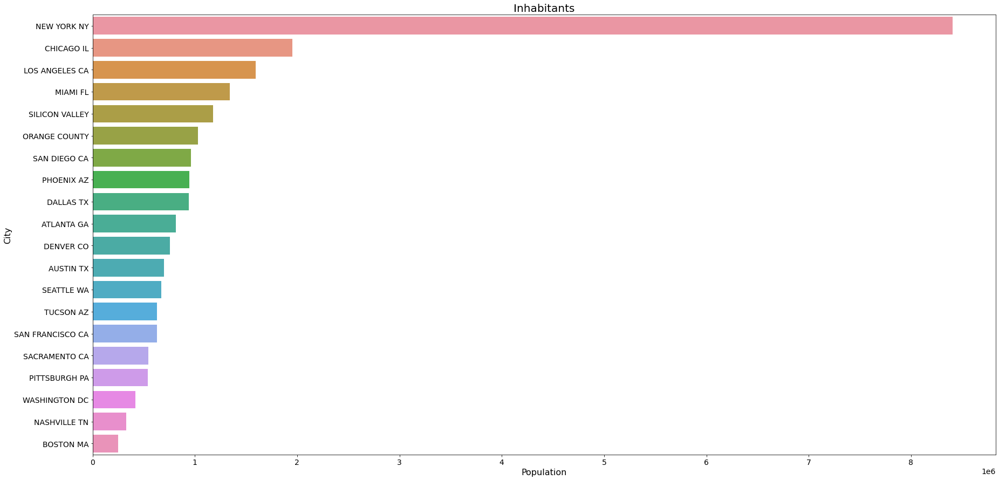

In [14]:
sb.barplot(x="Population",y="City",data=City).set(title="Inhabitants");

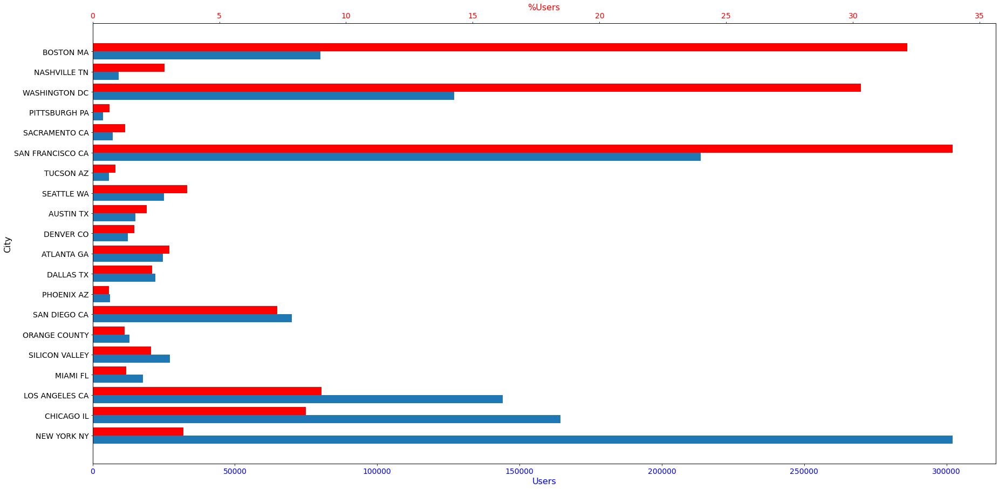

In [15]:
fig,ax1=plt.subplots()
y=np.arange(len(City["City"]))
width=0.2
x1,x2=City["Users"],City["%User"]
ax1.set_ylabel("City")
ax1.set_yticks(y, City["City"])
ax1.set_xlabel("Users",color="blue")
ax1.tick_params(axis="x",labelcolor="blue")
bar1=ax1.barh(y-width,x1,width*2,label="User")

ax2=ax1.twiny()

ax2.set_xlabel("%Users",color="red")
ax2.tick_params(axis="x",labelcolor="red")
bar2=ax2.barh(y+width,x2,width*2,label="Percentange",color="red")
plt.show()

As we can see, even if the number of cab users in NY is less than the 5% total, it has the highest number of users. Seeing this graph se can see that the most important cities for Cab companies are: New York, Chicago, Los Angeles, San Francisco, Washington, Boston and San Diego. The rest do not even have 50000 users and the percentage of users over the total population is lower than 5%.

### Cab Data

In [16]:
Cab_data["Benefits"]=Cab_data["Price Charged"]-Cab_data["Cost of Trip"]
Cab_data

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Period_date,Benefits
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,1_2016,57.3150
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,1_2016,23.6660
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.6320,1_2016,27.5680
3,10000014,2016-01-07,Pink Cab,ATLANTA GA,33.17,377.40,351.6020,1_2016,25.7980
4,10000015,2016-01-03,Pink Cab,ATLANTA GA,8.73,114.62,97.7760,1_2016,16.8440
...,...,...,...,...,...,...,...,...,...
359387,10440101,2018-01-08,Yellow Cab,WASHINGTON DC,4.80,69.24,63.3600,1_2018,5.8800
359388,10440104,2018-01-04,Yellow Cab,WASHINGTON DC,8.40,113.75,106.8480,1_2018,6.9020
359389,10440105,2018-01-05,Yellow Cab,WASHINGTON DC,27.75,437.07,349.6500,1_2018,87.4200
359390,10440106,2018-01-05,Yellow Cab,WASHINGTON DC,8.80,146.19,114.0480,1_2018,32.1420


In [17]:
Cab_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   Transaction ID  359392 non-null  int64   
 1   Date of Travel  359392 non-null  object  
 2   Company         359392 non-null  object  
 3   City            359392 non-null  object  
 4   KM Travelled    359392 non-null  float64 
 5   Price Charged   359392 non-null  float64 
 6   Cost of Trip    359392 non-null  float64 
 7   Period_date     359392 non-null  category
 8   Benefits        359392 non-null  float64 
dtypes: category(1), float64(4), int64(1), object(3)
memory usage: 22.3+ MB


In [18]:
Cab_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Transaction ID,359392.0,1.022076e+07,126805.803715,10000011.00,1.011081e+07,1.022104e+07,1.033094e+07,1.044011e+07
KM Travelled,359392.0,2.256725e+01,12.233526,1.90,1.200000e+01,2.244000e+01,3.296000e+01,4.800000e+01
Price Charged,359392.0,4.234433e+02,274.378911,15.60,2.064375e+02,3.863600e+02,5.836600e+02,2.048030e+03
Cost of Trip,359392.0,2.861901e+02,157.993661,19.00,1.512000e+02,2.824800e+02,4.136832e+02,6.912000e+02
Benefits,359392.0,1.372532e+02,160.311840,-220.06,2.801200e+01,8.196200e+01,1.900300e+02,1.463966e+03


In [19]:
Cab_data.describe(exclude="number").T

,count,unique,top,freq
Date of Travel,359392,1095,2018-01-05,2022
Company,359392,2,Yellow Cab,274681
City,359392,19,NEW YORK NY,99885
Period_date,359392,12,4_2017,45947


After seeing that there is no NA value, we proceed to see the benefits obtained by both companies in this period of time.

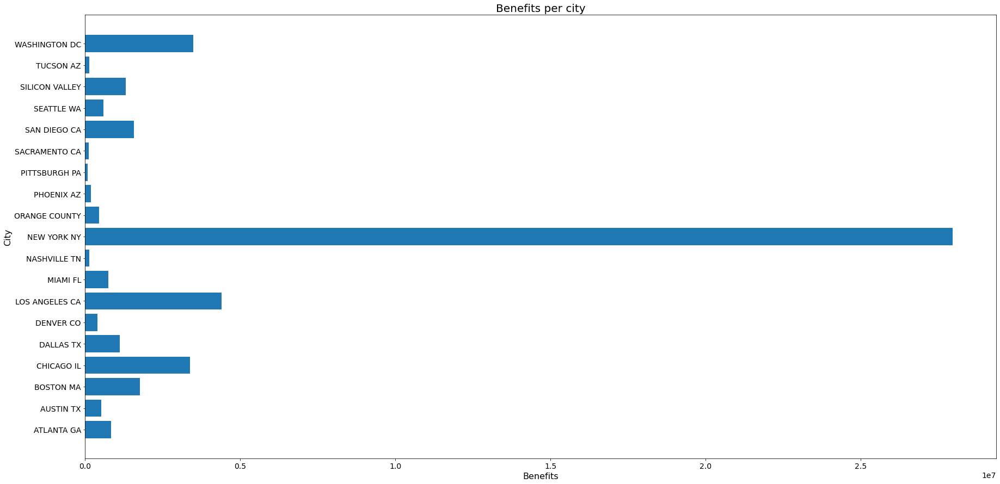

In [20]:
Benefits=Cab_data[["City","Benefits"]].groupby(["City"]).sum()
plt.barh(Benefits.index,Benefits["Benefits"]);
plt.title("Benefits per city")
plt.xlabel("Benefits")
plt.ylabel("City")
plt.show();

After this we create a pie to see the number of times that the clients choose the pink cab or the yellow cab.

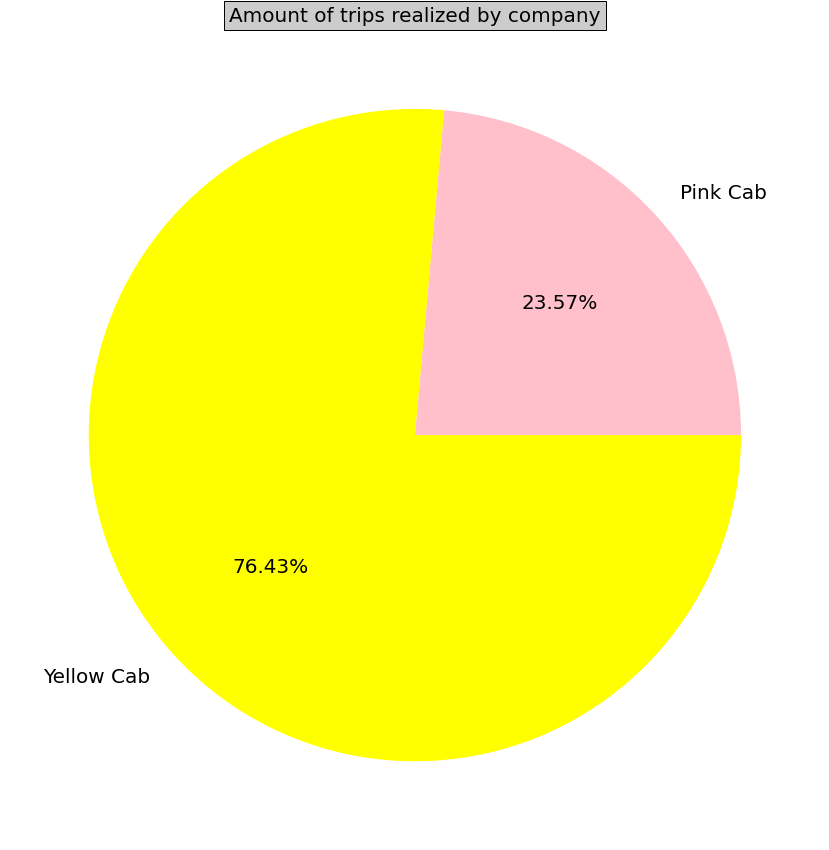

In [21]:
number_travels=Cab_data["Company"].groupby(Cab_data["Company"]).count()
plt.pie(number_travels,labels=number_travels.index,autopct='%4.2f%%',textprops={'fontsize': 20},colors=["pink","yellow"])
plt.title("Amount of trips realized by company", bbox={'facecolor':'0.8', 'pad':5})
plt.show();

For what we see the yellow cab is, in general terms, the prefered option.

### Customer ID

Here we can see a list of clients with data like their income gender and age.

In [22]:
income_group=pd.cut(Customer_ID["Income (USD/Month)"], bins=[0,2673.67,4451.08,8902.25,31157.83,120000],
                    labels=['Poor', 'Low-medium', 'Medium','Upper-medium','Rich'])
Customer_ID["income_group"]=income_group
age_group=pd.cut(Customer_ID["Age"], bins=[16,26,35,46,55,66],
                    labels=['Young adult', 'Adult', 'Young Middle Aged','Middle Aged','Senior adult'])
Customer_ID["age_group"]=age_group
Customer_ID

,Customer ID,Gender,Age,Income (USD/Month),income_group,age_group
0,29290,Male,28,10813,Upper-medium,Adult
1,27703,Male,27,9237,Upper-medium,Adult
2,28712,Male,53,11242,Upper-medium,Middle Aged
3,28020,Male,23,23327,Upper-medium,Young adult
4,27182,Male,33,8536,Medium,Adult
...,...,...,...,...,...,...
49166,12490,Male,33,18713,Upper-medium,Adult
49167,14971,Male,30,15346,Upper-medium,Adult
49168,41414,Male,38,3960,Low-medium,Young Middle Aged
49169,41677,Male,23,19454,Upper-medium,Young adult


We have created two new categories. The first one is refered to the class income acording to https://money.usnews.com/money/personal-finance/family-finance/articles/where-do-i-fall-in-the-american-economic-class-system where the economic class is separated into 5 catergories. This categories are used assuming that the income goes to a family of at least 3 members. 

In the second category I created an age category related with every age group present. Because The group ages are really big I decided to divide the young adult and middle aged in two. This way we have:
Young-adult:16-26
Adult:27-35
Young Middle-aged:36-46
Middle-aged: 47-55
Senior-adult:56-65

In [23]:
Customer_ID.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49171 entries, 0 to 49170
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Customer ID         49171 non-null  int64   
 1   Gender              49171 non-null  object  
 2   Age                 49171 non-null  int64   
 3   Income (USD/Month)  49171 non-null  int64   
 4   income_group        49171 non-null  category
 5   age_group           49171 non-null  category
dtypes: category(2), int64(3), object(1)
memory usage: 1.6+ MB


In [24]:
Customer_ID.describe().T

,count,mean,std,min,25%,50%,75%,max
Customer ID,49171.0,28398.252283,17714.137333,1.0,12654.5,27631.0,43284.5,60000.0
Age,49171.0,35.363121,12.599066,18.0,25.0,33.0,42.0,65.0
Income (USD/Month),49171.0,15015.631856,8002.208253,2000.0,8289.5,14656.0,21035.0,35000.0


In [25]:
Customer_ID.describe(exclude="number").T

,count,unique,top,freq
Gender,49171,2,Male,26562
income_group,49171,5,Upper-medium,33884
age_group,49171,5,Young adult,14239


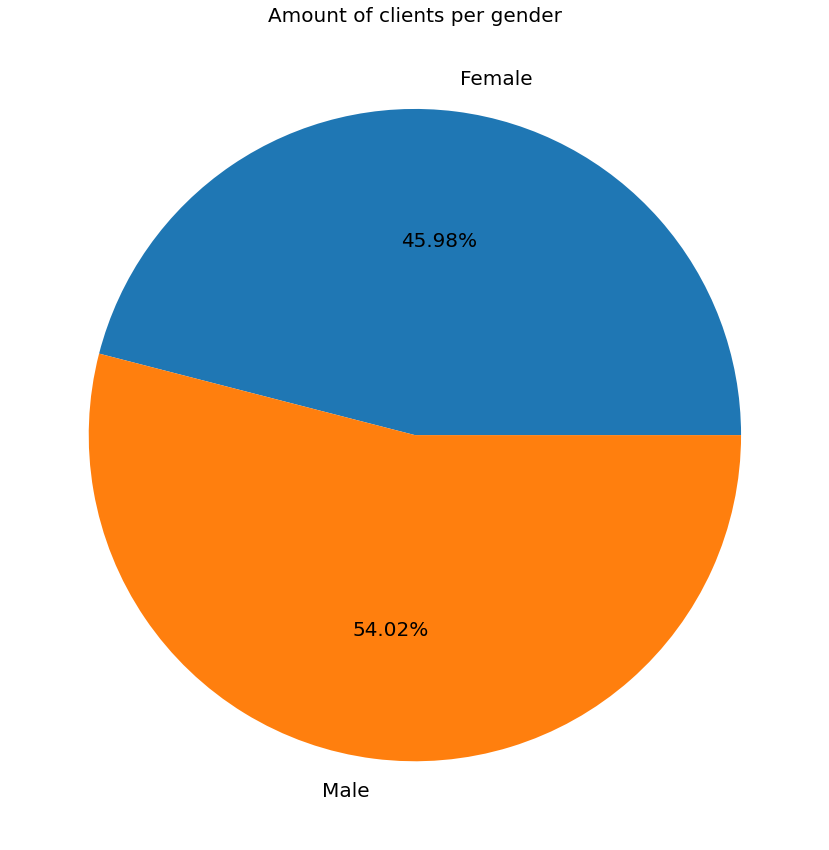

In [26]:
plt.pie(Customer_ID["Gender"].groupby(Customer_ID["Gender"]).count(),
labels=["Female","Male"],autopct='%4.2f%%',textprops={'fontsize': 20})
plt.title("Amount of clients per gender")
plt.show();

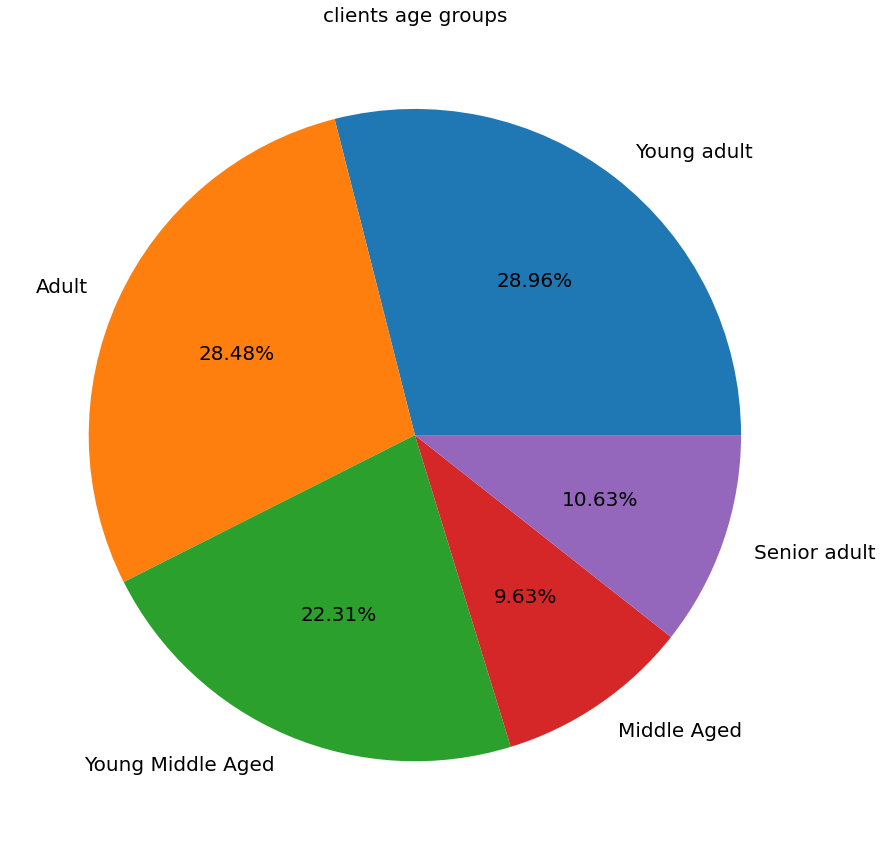

In [27]:
plt.pie(Customer_ID["age_group"].groupby(Customer_ID["age_group"]).count(),
labels=Customer_ID["age_group"].cat.categories,autopct='%4.2f%%',textprops={'fontsize': 20})
plt.title("clients age groups")
plt.show();

As we can see most of the clients are young, between 18 and 36 years old. This could be because of their life style. That means that they use the taxis to go to work and held social events.

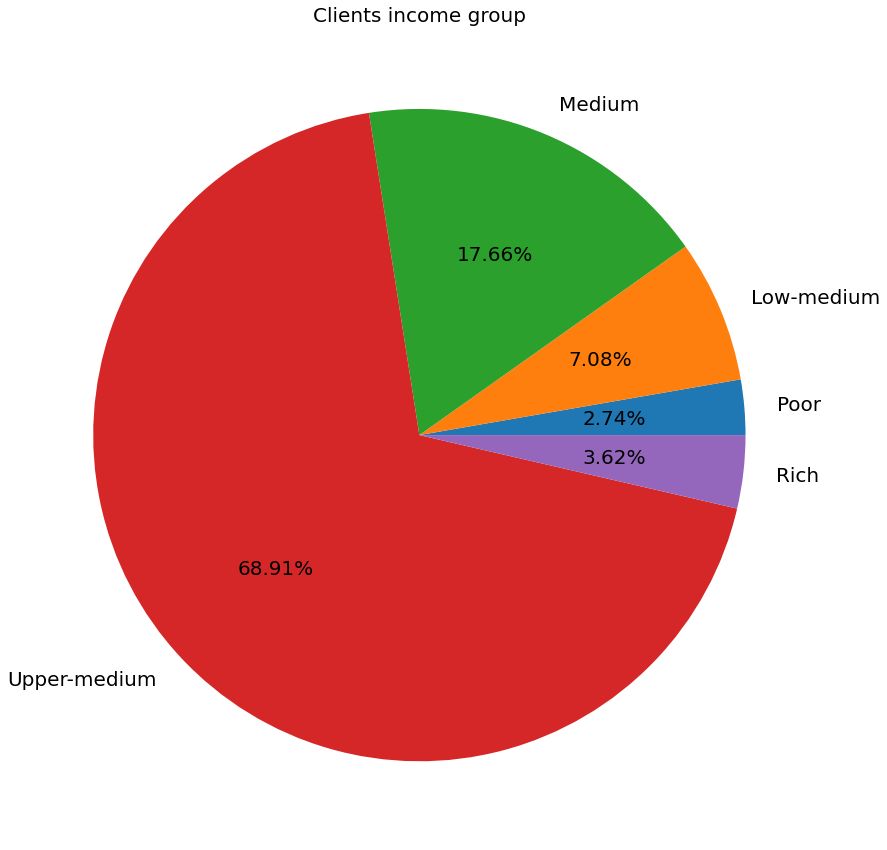

In [28]:
plt.pie(Customer_ID["income_group"].groupby(Customer_ID["income_group"]).count(),
labels=Customer_ID["income_group"].cat.categories,autopct='%4.2f%%',textprops={'fontsize': 20})
plt.title("Clients income group")
plt.show();

In this pie chart we can see that almost the 70% of the clients have an income that belongs to the upper-middle class.

And now we are going to create a histplot too see from which income and age group is more abundant between clients.

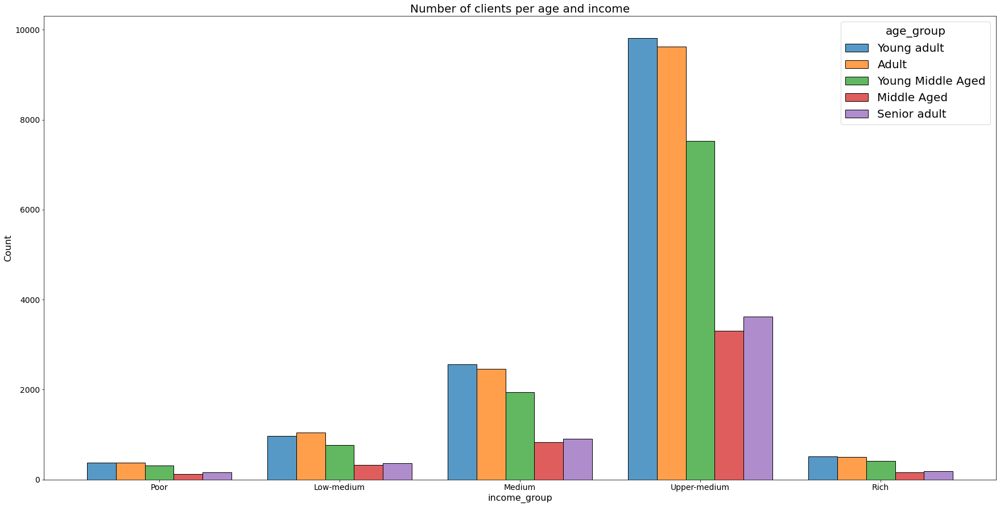

In [29]:
#Customer_ID["Age"].groupby(Customer_ID["cut_age"]).count()
sb.histplot(data=Customer_ID,x="income_group",hue="age_group",multiple="dodge",
            shrink=.8).set(title="Number of clients per age and income");

Most of the customers from both companies are from the upper medium class and the most abundant amount of clients are young that is between 18 and 36. There is also a significant part of the clients

### Transaction_ID

In [30]:
Transaction_ID

,Transaction ID,Customer ID,Payment_Mode
0,10000011,29290,Card
1,10000012,27703,Card
2,10000013,28712,Cash
3,10000014,28020,Cash
4,10000015,27182,Card
...,...,...,...
440093,10440104,53286,Cash
440094,10440105,52265,Cash
440095,10440106,52175,Card
440096,10440107,52917,Card


In [31]:
Transaction_ID.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440098 entries, 0 to 440097
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Transaction ID  440098 non-null  int64 
 1   Customer ID     440098 non-null  int64 
 2   Payment_Mode    440098 non-null  object
dtypes: int64(2), object(1)
memory usage: 10.1+ MB


In [32]:
Transaction_ID.describe().T

,count,mean,std,min,25%,50%,75%,max
Transaction ID,440098.0,1.022006e+07,127045.493722,10000011.0,10110035.25,10220059.5,10330083.75,10440108.0
Customer ID,440098.0,2.361951e+04,21195.549816,1.0,3530.00,15168.0,43884.00,60000.0


In [33]:
Transaction_ID.describe(exclude="number").T

,count,unique,top,freq
Payment_Mode,440098,2,Card,263991


In [34]:
payment=Transaction_ID["Payment_Mode"].groupby(Transaction_ID["Payment_Mode"]).count()

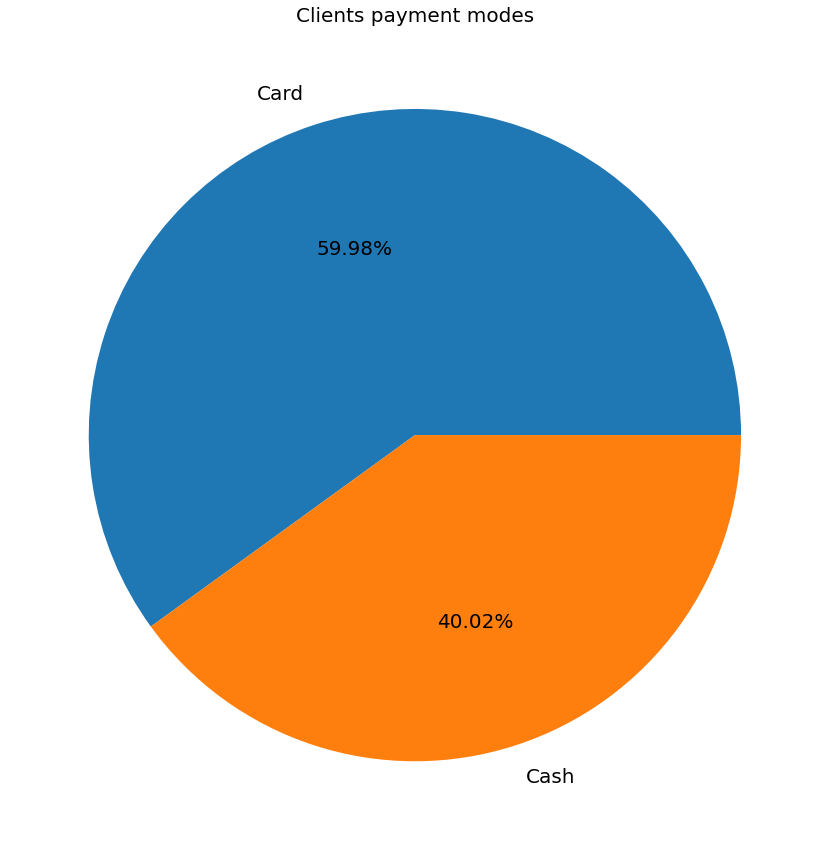

In [35]:
plt.pie(payment,labels=payment.index,autopct='%4.2f%%',textprops={'fontsize': 20})
plt.title("Clients payment modes");

With this we can see that most of the payments were done with credit card.

Now is the time to merge the four datasets into one. To do so we have to find the columns that are related with each other. 

##### the column City can be used to join City and Cab_data. 

##### Customer_ID to join Transaction_ID and Customer_ID. 

##### Transaction_ID shares column with the datasets Cab_Data and Transaction_ID.



### Merging transiction_ID and customer_ID.

In [36]:
Transaction_ID_merge=pd.merge(Transaction_ID,Customer_ID,on="Customer ID")
Transaction_ID_merge

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),income_group,age_group
0,10000011,29290,Card,Male,28,10813,Upper-medium,Adult
1,10351127,29290,Cash,Male,28,10813,Upper-medium,Adult
2,10412921,29290,Card,Male,28,10813,Upper-medium,Adult
3,10000012,27703,Card,Male,27,9237,Upper-medium,Adult
4,10320494,27703,Card,Male,27,9237,Upper-medium,Adult
...,...,...,...,...,...,...,...,...
440093,10439799,12490,Cash,Male,33,18713,Upper-medium,Adult
440094,10439820,14971,Card,Male,30,15346,Upper-medium,Adult
440095,10439838,41414,Card,Male,38,3960,Low-medium,Young Middle Aged
440096,10439840,41677,Cash,Male,23,19454,Upper-medium,Young adult


Because merge is an inner join, there is no need to check if it has been formed any NA values, because he have cheked proeviously that the previous datasets were clean of NAs.

In [37]:
for col in Transaction_ID_merge.columns:
    print(col,len(np.unique(Transaction_ID_merge[col])))

Transaction ID 440098
Customer ID 49171
Payment_Mode 2
Gender 2
Age 48
Income (USD/Month) 23341
income_group 5
age_group 5


We have decided to use an inner join (merge) as we do not lose information and we can see all the information of the clients that realized that transaction.

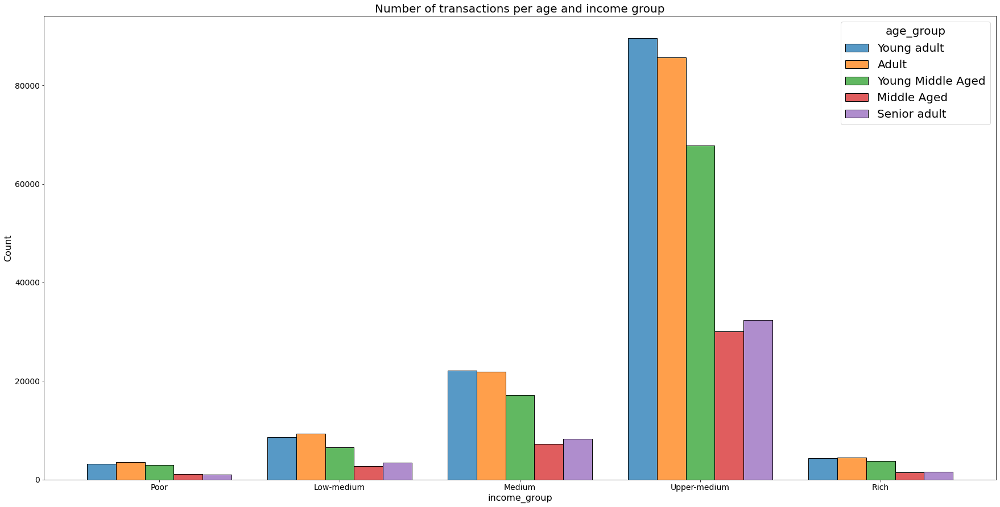

In [38]:
sb.histplot(data=Transaction_ID_merge,x="income_group",hue="age_group",multiple="dodge",
            shrink=.8).set(title="Number of transactions per age and income group");

## Merging Cab_data and City

In [39]:
merge_city=pd.merge(Cab_data,City,on="City")
merge_city

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Period_date,Benefits,Population,Users,%User
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,1_2016,57.3150,814885,24701,3.031225
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,1_2016,23.6660,814885,24701,3.031225
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.6320,1_2016,27.5680,814885,24701,3.031225
3,10000014,2016-01-07,Pink Cab,ATLANTA GA,33.17,377.40,351.6020,1_2016,25.7980,814885,24701,3.031225
4,10000015,2016-01-03,Pink Cab,ATLANTA GA,8.73,114.62,97.7760,1_2016,16.8440,814885,24701,3.031225
...,...,...,...,...,...,...,...,...,...,...,...,...
359387,10440101,2018-01-08,Yellow Cab,WASHINGTON DC,4.80,69.24,63.3600,1_2018,5.8800,418859,127001,30.320705
359388,10440104,2018-01-04,Yellow Cab,WASHINGTON DC,8.40,113.75,106.8480,1_2018,6.9020,418859,127001,30.320705
359389,10440105,2018-01-05,Yellow Cab,WASHINGTON DC,27.75,437.07,349.6500,1_2018,87.4200,418859,127001,30.320705
359390,10440106,2018-01-05,Yellow Cab,WASHINGTON DC,8.80,146.19,114.0480,1_2018,32.1420,418859,127001,30.320705


In [40]:
merge_city.describe().T

,count,mean,std,min,25%,50%,75%,max
Transaction ID,359392.0,1.022076e+07,1.268058e+05,1.000001e+07,1.011081e+07,1.022104e+07,1.033094e+07,1.044011e+07
KM Travelled,359392.0,2.256725e+01,1.223353e+01,1.900000e+00,1.200000e+01,2.244000e+01,3.296000e+01,4.800000e+01
Price Charged,359392.0,4.234433e+02,2.743789e+02,1.560000e+01,2.064375e+02,3.863600e+02,5.836600e+02,2.048030e+03
Cost of Trip,359392.0,2.861901e+02,1.579937e+02,1.900000e+01,1.512000e+02,2.824800e+02,4.136832e+02,6.912000e+02
Benefits,359392.0,1.372532e+02,1.603118e+02,-2.200600e+02,2.801200e+01,8.196200e+01,1.900300e+02,1.463966e+03
Population,359392.0,3.132198e+06,3.315194e+06,2.489680e+05,6.712380e+05,1.595037e+06,8.405837e+06,8.405837e+06
Users,359392.0,1.583656e+05,1.008501e+05,3.643000e+03,8.002100e+04,1.441320e+05,3.021490e+05,3.021490e+05
%User,359392.0,1.066866e+01,1.063311e+01,6.496829e-01,3.594514e+00,7.296413e+00,9.036279e+00,3.214108e+01


Here we can measure the previous values and compare the number of clients between both companies in the cities

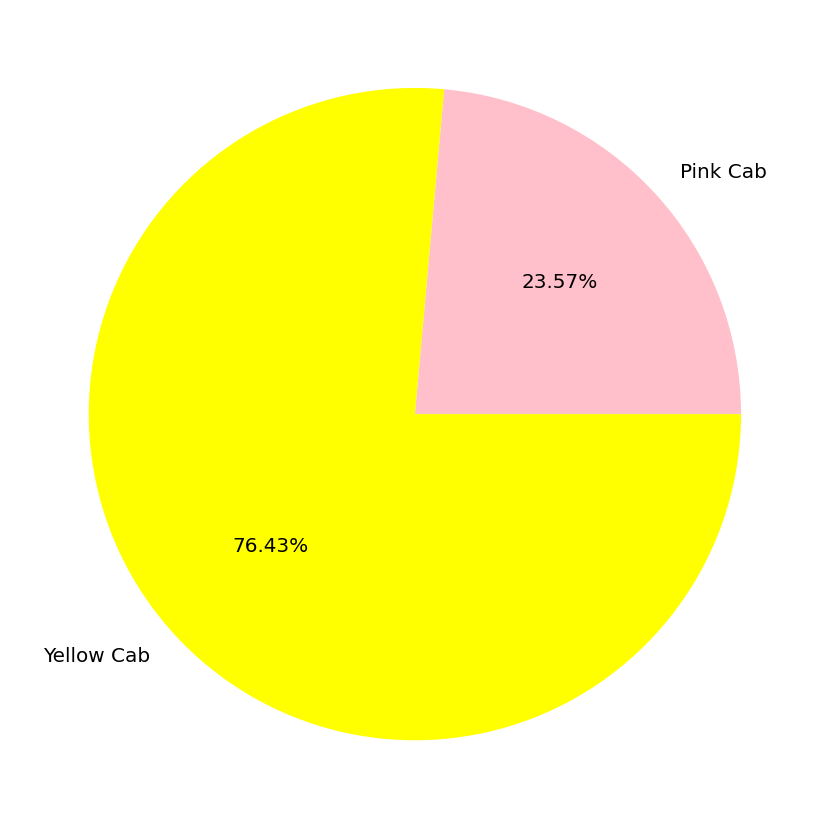

In [41]:
Group=merge_city["Company"].groupby(merge_city["Company"]).count()
plt.pie(Group,labels=Group.index,autopct='%4.2f%%',textprops={'fontsize':20},colors=["pink","yellow"]);

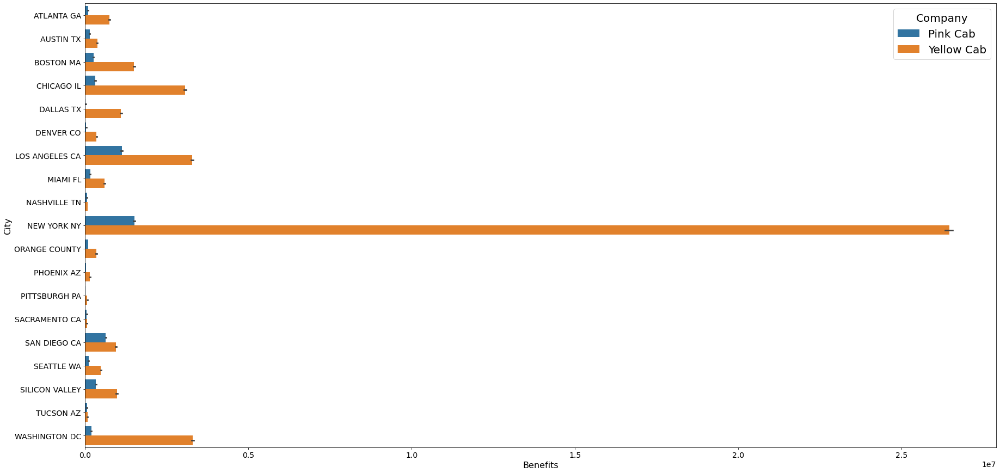

In [42]:
sb.barplot(data=merge_city,y="City",x="Benefits", hue="Company",estimator=sum);

Seen this graph we can be sure that we would prefer the yellow cab over the pink cab. Now we have to see the evolution of the benefits over time by each company to see which one is getting better performance over time. We also see that most of the benefits ob the yellow cab comes from New York.

Now let us check the amount of benefits obtained per trimester. For this let us first see the amount of clients that used the taxis for each Company.

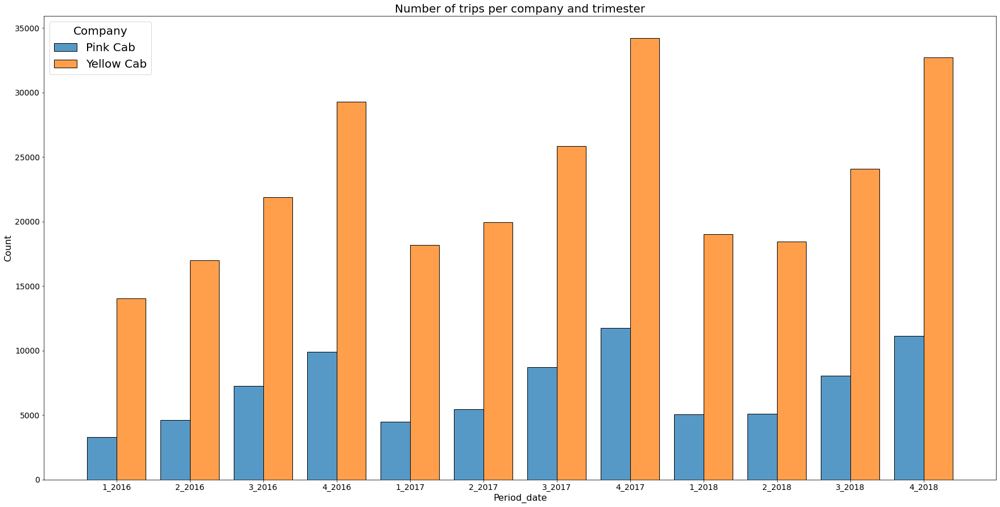

In [43]:
sb.histplot(data=merge_city,x="Period_date",hue="Company",multiple="dodge",
            shrink=.8).set(title="Number of trips per company and trimester");

As we can see here, the number of trips is lower in the first trimestres and goes increasing up to the fourth trimester.

In [44]:
merge_city["Benefits"].groupby(merge_city["Period_date"]).sum()

Period_date
1_2016    3.109366e+06
2_2016    3.690516e+06
3_2016    3.590158e+06
4_2016    5.250467e+06
1_2017    3.989157e+06
2_2017    4.249791e+06
3_2017    4.278124e+06
4_2017    6.092561e+06
1_2018    3.467983e+06
2_2018    3.408411e+06
3_2018    3.226654e+06
4_2018    4.974514e+06
Name: Benefits, dtype: float64

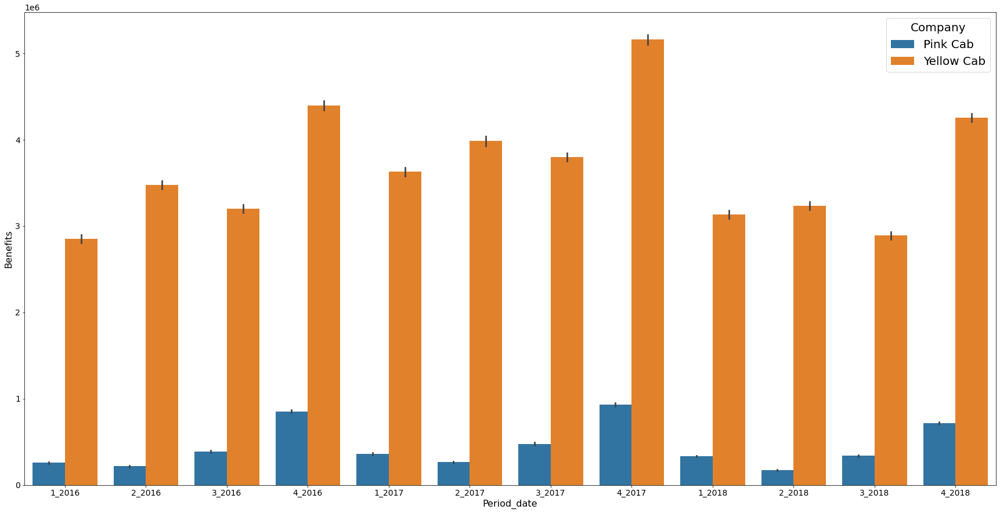

In [45]:
sb.barplot(data=merge_city,x="Period_date",y="Benefits",hue="Company",estimator=sum);

Interestingly, the benefits do not correlate with the amount of travels that take place each trimester with the benefits obtained. This could be because In the second and third trimester of each year is when there is a higher number of trips with losses.

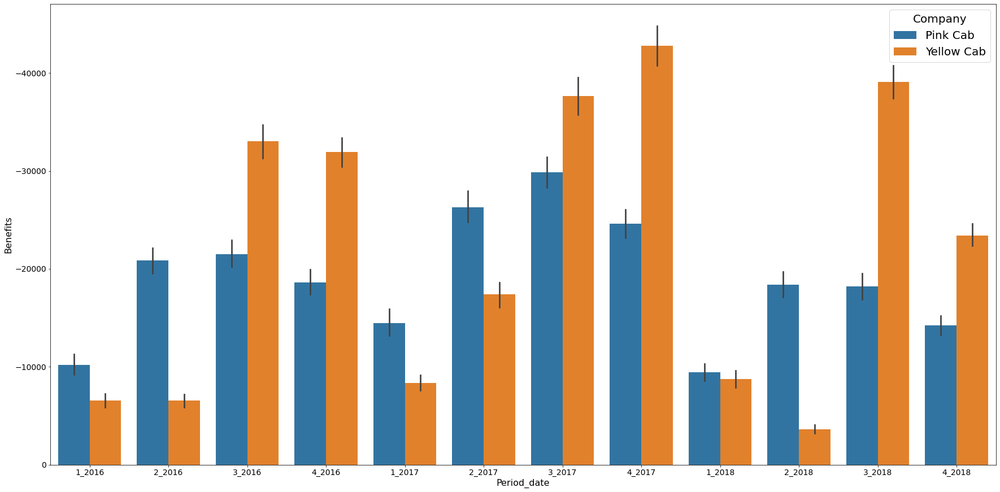

In [46]:
sb.barplot(data=merge_city.where(merge_city["Benefits"]<0),x="Period_date",
y="Benefits",hue="Company",estimator=sum).invert_yaxis()

From what we can see, The pink company has most of the time higher losses in the second and third trimester while the yellow company. With all the info obtained we would asume that chosing the yelloy Cab company would be the best decision.
But, for now, let us finalize combining all the dataframes in a single one

# DataFrame Combined

For the final dataframe we will join both dataframes with an inner join Transaction_ID_merge and merge_city. This way we will add new information to merge_city and remove any NA value that may surge because not all Transaction ID may coincede.

In [47]:
df_Merged=pd.merge(merge_city,Transaction_ID_merge,on="Transaction ID")
df_Merged

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Period_date,Benefits,Population,Users,%User,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),income_group,age_group
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,1_2016,57.3150,814885,24701,3.031225,29290,Card,Male,28,10813,Upper-medium,Adult
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,1_2016,23.6660,814885,24701,3.031225,27703,Card,Male,27,9237,Upper-medium,Adult
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.6320,1_2016,27.5680,814885,24701,3.031225,28712,Cash,Male,53,11242,Upper-medium,Middle Aged
3,10000014,2016-01-07,Pink Cab,ATLANTA GA,33.17,377.40,351.6020,1_2016,25.7980,814885,24701,3.031225,28020,Cash,Male,23,23327,Upper-medium,Young adult
4,10000015,2016-01-03,Pink Cab,ATLANTA GA,8.73,114.62,97.7760,1_2016,16.8440,814885,24701,3.031225,27182,Card,Male,33,8536,Medium,Adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359387,10440101,2018-01-08,Yellow Cab,WASHINGTON DC,4.80,69.24,63.3600,1_2018,5.8800,418859,127001,30.320705,52392,Cash,Male,24,15651,Upper-medium,Young adult
359388,10440104,2018-01-04,Yellow Cab,WASHINGTON DC,8.40,113.75,106.8480,1_2018,6.9020,418859,127001,30.320705,53286,Cash,Male,32,6528,Medium,Adult
359389,10440105,2018-01-05,Yellow Cab,WASHINGTON DC,27.75,437.07,349.6500,1_2018,87.4200,418859,127001,30.320705,52265,Cash,Male,56,7966,Medium,Senior adult
359390,10440106,2018-01-05,Yellow Cab,WASHINGTON DC,8.80,146.19,114.0480,1_2018,32.1420,418859,127001,30.320705,52175,Card,Male,32,6423,Medium,Adult


In [48]:
df_Merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 19 columns):
 #   Column              Non-Null Count   Dtype   
---  ------              --------------   -----   
 0   Transaction ID      359392 non-null  int64   
 1   Date of Travel      359392 non-null  object  
 2   Company             359392 non-null  object  
 3   City                359392 non-null  object  
 4   KM Travelled        359392 non-null  float64 
 5   Price Charged       359392 non-null  float64 
 6   Cost of Trip        359392 non-null  float64 
 7   Period_date         359392 non-null  category
 8   Benefits            359392 non-null  float64 
 9   Population          359392 non-null  int64   
 10  Users               359392 non-null  int64   
 11  %User               359392 non-null  float64 
 12  Customer ID         359392 non-null  int64   
 13  Payment_Mode        359392 non-null  object  
 14  Gender              359392 non-null  object  
 15  Age              

In [49]:
df_Merged.describe().T

,count,mean,std,min,25%,50%,75%,max
Transaction ID,359392.0,1.022076e+07,1.268058e+05,1.000001e+07,1.011081e+07,1.022104e+07,1.033094e+07,1.044011e+07
KM Travelled,359392.0,2.256725e+01,1.223353e+01,1.900000e+00,1.200000e+01,2.244000e+01,3.296000e+01,4.800000e+01
Price Charged,359392.0,4.234433e+02,2.743789e+02,1.560000e+01,2.064375e+02,3.863600e+02,5.836600e+02,2.048030e+03
Cost of Trip,359392.0,2.861901e+02,1.579937e+02,1.900000e+01,1.512000e+02,2.824800e+02,4.136832e+02,6.912000e+02
Benefits,359392.0,1.372532e+02,1.603118e+02,-2.200600e+02,2.801200e+01,8.196200e+01,1.900300e+02,1.463966e+03
Population,359392.0,3.132198e+06,3.315194e+06,2.489680e+05,6.712380e+05,1.595037e+06,8.405837e+06,8.405837e+06
Users,359392.0,1.583656e+05,1.008501e+05,3.643000e+03,8.002100e+04,1.441320e+05,3.021490e+05,3.021490e+05
%User,359392.0,1.066866e+01,1.063311e+01,6.496829e-01,3.594514e+00,7.296413e+00,9.036279e+00,3.214108e+01
Customer ID,359392.0,1.919165e+04,2.101241e+04,1.000000e+00,2.705000e+03,7.459000e+03,3.607800e+04,6.000000e+04
Age,359392.0,3.533670e+01,1.259423e+01,1.800000e+01,2.500000e+01,3.300000e+01,4.200000e+01,6.500000e+01


In [50]:
df_Merged.describe(exclude="number").T

,count,unique,top,freq
Date of Travel,359392,1095,2018-01-05,2022
Company,359392,2,Yellow Cab,274681
City,359392,19,NEW YORK NY,99885
Period_date,359392,12,4_2017,45947
Payment_Mode,359392,2,Card,215504
Gender,359392,2,Male,205912
income_group,359392,5,Upper-medium,249568
age_group,359392,5,Young adult,104999


We will consider that the number travels in this dataframe it is not the total. We assume that the number of clients were randomly taken so the proportion should be the same. However, in case that this is not true we simply have to measure the eficiency of each company. As we have seen, in the time of the year with more trips the yellow company, despite havimg more benefits, his trips with negative values have a value more than double than the pink company. Now I have to see who is more efficient by trimester and if there exist any relation between the benefists of the trip and the Kilometers travelled depending on the city.

In [51]:
customers=df_Merged[["Customer ID","Company"]]
customers

,Customer ID,Company
0,29290,Pink Cab
1,27703,Pink Cab
2,28712,Pink Cab
3,28020,Pink Cab
4,27182,Pink Cab
...,...,...
359387,52392,Yellow Cab
359388,53286,Yellow Cab
359389,52265,Yellow Cab
359390,52175,Yellow Cab


<AxesSubplot:ylabel='Count'>

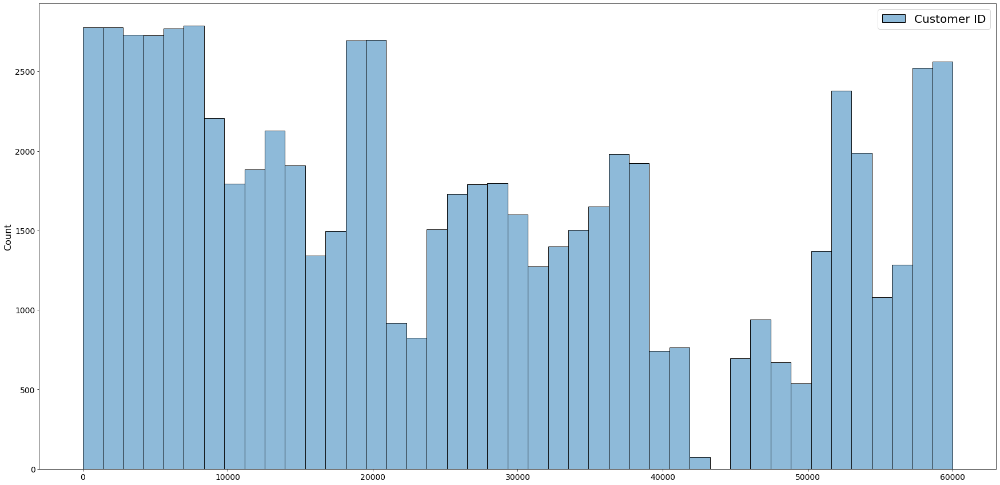

In [52]:
sb.histplot(data=customers.drop_duplicates())

In [53]:
customers2=customers.drop_duplicates()
customers2=customers2.groupby(customers2["Company"]).count()
customers2

,Customer ID
Company,
Pink Cab,32330
Yellow Cab,39896


In [54]:
customers2.sum()-df_Merged["Customer ID"].drop_duplicates().count()

Customer ID    26078
dtype: int64

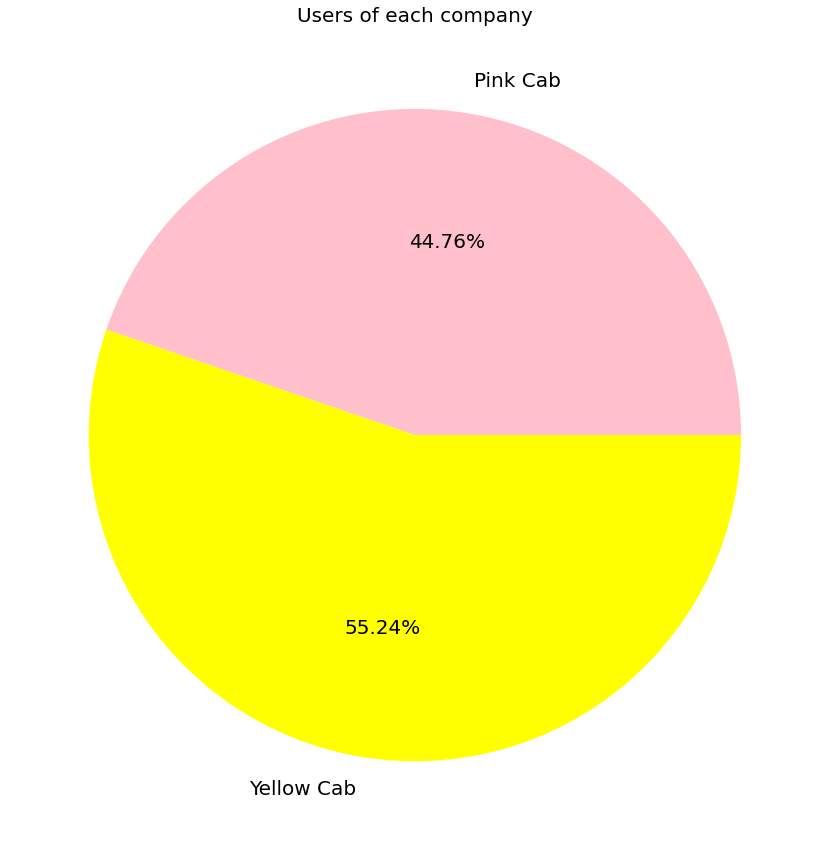

In [55]:
plt.pie(customers2["Customer ID"],labels=customers2.index,autopct='%4.2f%%',textprops={'fontsize':20},colors=["pink","yellow"])
plt.title("Users of each company");

In this pie chart we can see that the number of clients that use the yellow cab is a little higher than the clients that use the pink cab. Now we create a dataframe where we see the clients that choose more than one time the same 

In [56]:
count_customers=customers.groupby(["Customer ID","Company"]).size()
df_customers=pd.DataFrame(count_customers)#.where(count_customers>10).dropna().count()
df_customers=df_customers.reset_index(level=[0,1])
df_customers

,Customer ID,Company,0
0,1,Pink Cab,4
1,1,Yellow Cab,25
2,2,Pink Cab,4
3,2,Yellow Cab,36
4,3,Pink Cab,6
...,...,...,...
72221,59998,Yellow Cab,6
72222,59999,Pink Cab,2
72223,59999,Yellow Cab,6
72224,60000,Pink Cab,4


Now let us create a dataframe that shows us how many users made a trip this two years and how many times they have used each cab.

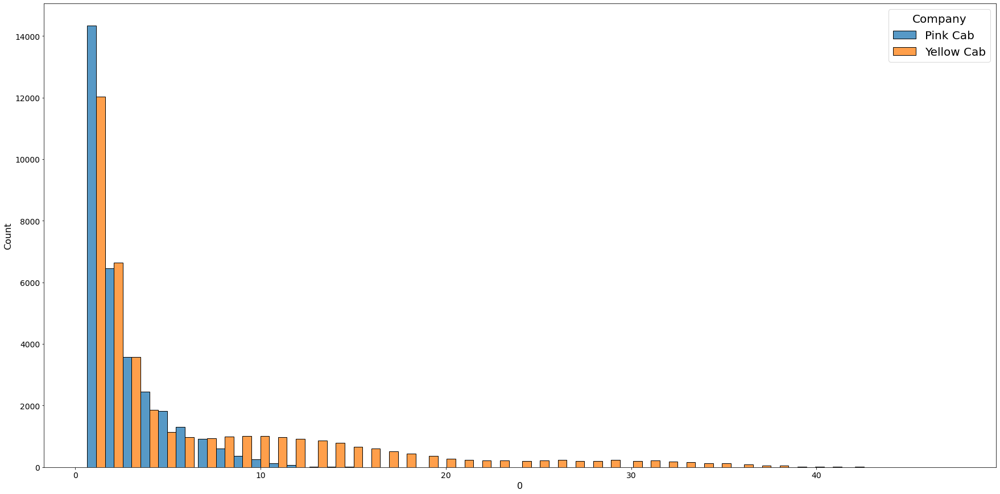

In [57]:
sb.histplot(data=df_customers,x=0,hue="Company",multiple="dodge",
            shrink=4);

As we can see, that the number of times a user uses the pink Cab is between 1 and 10. As for the yellow cab, there is a high number of users that prefer the yellow cab and chose it again. This must mean that the yellow cab have to provide a service that most users prefer.

In [58]:
yellow_df=df_Merged.where(df_Merged["Company"]=="Yellow Cab").dropna()
pink_df=df_Merged.where(df_Merged["Company"]=="Pink Cab").dropna()

Now we try to measure the benefit per client per travel ($/travel) to see which company wins more per client. We search this to try to find a reason why the yellow cab has more trips than the pink company.

In [59]:
customers2.loc["Pink Cab"]*pink_df.shape[0]

Customer ID    2738706630
Name: Pink Cab, dtype: int64

In [60]:
customers2.loc["Yellow Cab"]*yellow_df.shape[0]

Customer ID    10958673176
Name: Yellow Cab, dtype: int64

In [61]:
pink_df["Benefits"].mean()

62.65217410961976

In [62]:
pink_df["Benefits"].groupby(pink_df["Period_date"]).mean()

Period_date
1_2016    77.872337
2_2016    46.888441
3_2016    53.268325
4_2016    86.179460
1_2017    80.976614
2_2017    48.483980
3_2017    54.899465
4_2017    79.416948
1_2018    66.057873
2_2018    34.055059
3_2018    41.875555
4_2018    64.403309
Name: Benefits, dtype: float64

In [63]:
yellow_df["Benefits"].mean()

160.25998584103013

In [64]:
yellow_df["Benefits"].groupby(yellow_df["Period_date"]).mean()

Period_date
1_2016    202.911428
2_2016    204.316973
3_2016    146.371978
4_2016    150.115537
1_2017    199.461266
2_2017    199.904330
3_2017    147.070160
4_2017    150.837731
1_2018    164.964511
2_2018    175.464919
3_2018    119.967724
4_2018    130.109586
Name: Benefits, dtype: float64

And this can be easily seen if we use barplot

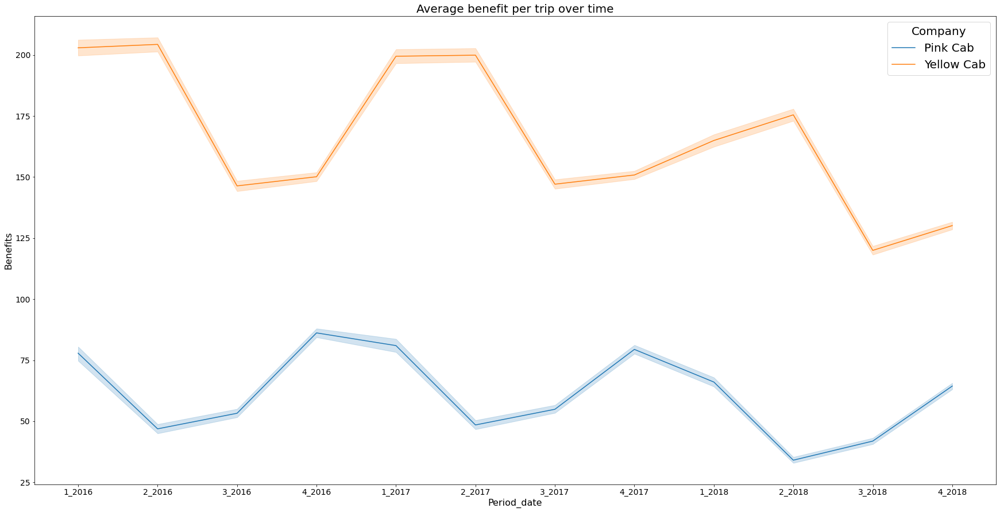

In [65]:
sb.lineplot(data=df_Merged,y="Benefits",x="Period_date",hue="Company").set(title="Average benefit per trip over time");

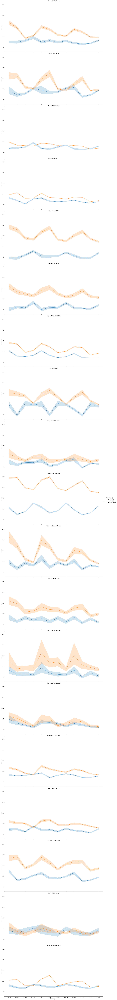

In [66]:
sb.FacetGrid(df_Merged,row="City",hue="Company",height=10,aspect=2).map(sb.lineplot,
            "Period_date","Benefits").add_legend();

Now that we have seen the benefits we want to know why the yellow cab is prefered to use before the pink cab.
We are going to see first the average cost of trip for each company ant trimester. The hypothesis is that the average cost of a trip should be cheaper in the yellow cab, and that is way is usually used more often.

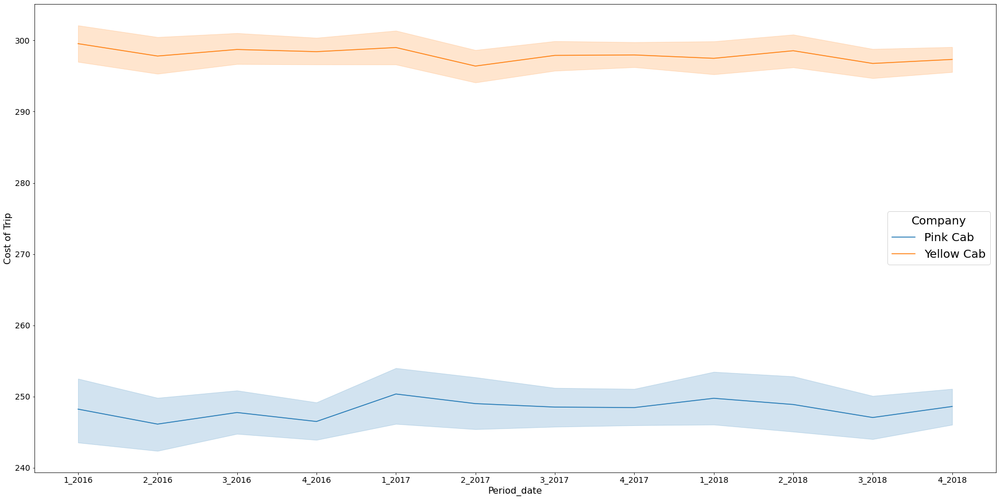

In [67]:
sb.lineplot(data=df_Merged,y="Cost of Trip",x="Period_date",hue="Company");

As we can see, the cost for a trip is higher in average for the yellow cab vs the pink cab. Therefore our previous hypothesis might be wrong. Perhaps is the cost per kilometer is cheaper in the yellow cab for each city and the reason the mean value is higher is because most of the trips take place in more expensive cities. To finish with the previous hipotesis, let us see the average cost of each trip for each city.

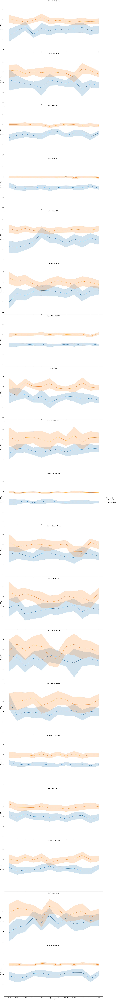

In [68]:
sb.FacetGrid(df_Merged,row="City",hue="Company",height=10,aspect=2).map(sb.lineplot,
            "Period_date","Cost of Trip").add_legend();

With this facetgrif is confirmed that the average trip made by the yellow cab are higher than in the pink cab. Now it is time to see the different costs per kilometer for each city and company. Maybe the reason is that the cost for long trips is cheaper.

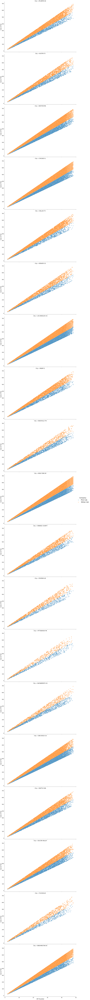

In [69]:
sb.FacetGrid(df_Merged,row="City",hue="Company",height=10,aspect=1.5).map(sb.scatterplot,
            "KM Travelled","Cost of Trip").add_legend();

So in the end we have that the yellow cab has more expenses than the pink cab. Considering that most users of the Cabs have an inkeep of upper medium. Most probably is because thay want to have a more confortable medium of transportation. Also the rich population is ignorable here because most probable they could afford to own a car and their personal driver.

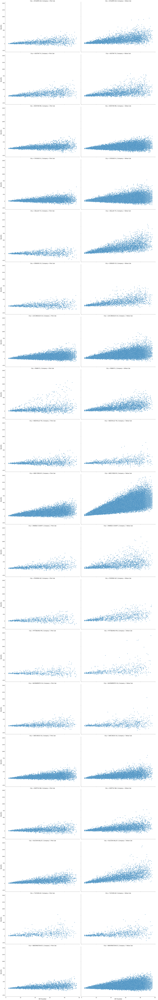

In [70]:
sb.FacetGrid(df_Merged,row="City",col="Company",height=10,aspect=1.5).map(sb.scatterplot,
            "KM Travelled","Benefits").add_legend();

With these graphics we see something unexpected, and is that each trip provide an small benefit. However, it is true that we see a relation between the amount of kilometers travelled and the cone of benefits. That means that a long trip usually provide high benefits, but there is some times there you can get losses. Despite this, we can see that the benefits outweights the losses.

With this it would be clear that the reason most of the people uses the yellow cab. This is because most of the users are young (do not have saved enought to buy a car) and have an income considered in the scale of upper medium. We also have to consider that most users prefer the yellow option despite being more expensive. This is probably bwcause it also offers a better service and in the perspective of the users the relation price quality is higher. To prove this I will create a facetgrid that should show that in the cities where the companies win most money most of the clients are young.

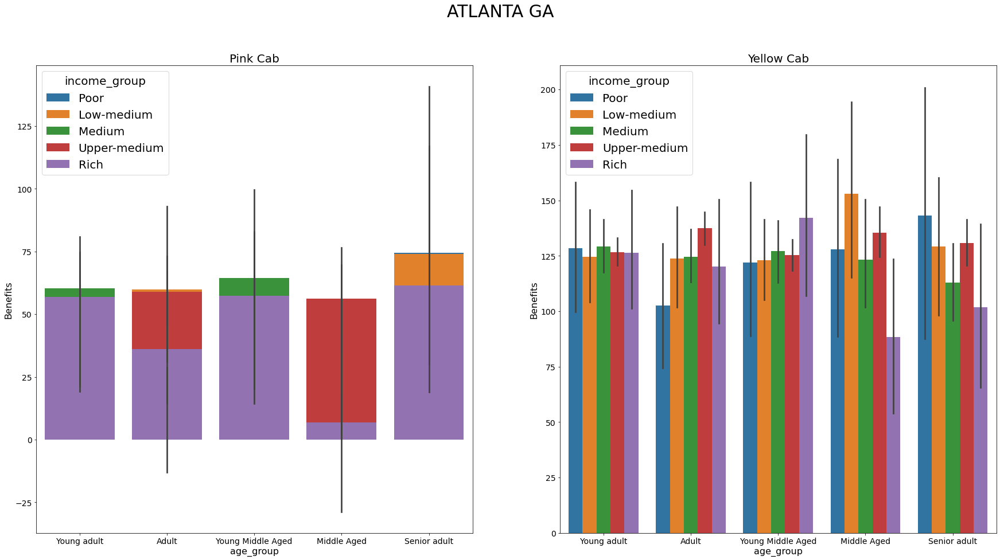

<Figure size 2160x1080 with 0 Axes>

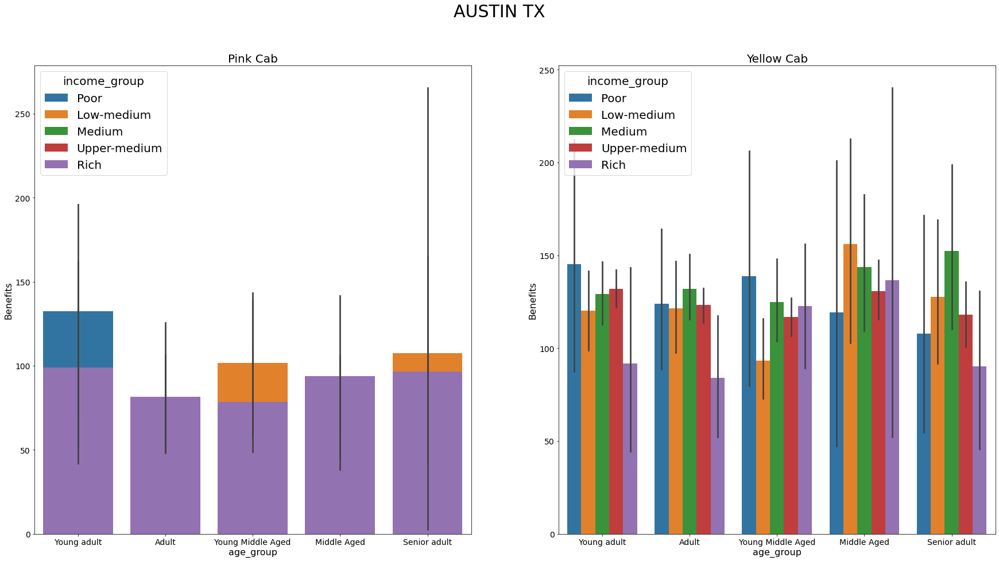

<Figure size 2160x1080 with 0 Axes>

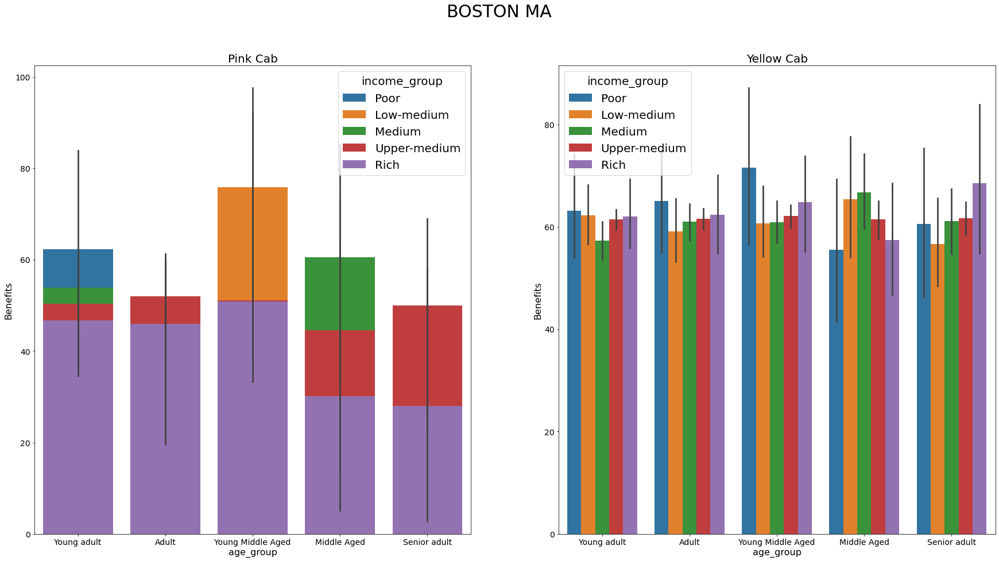

<Figure size 2160x1080 with 0 Axes>

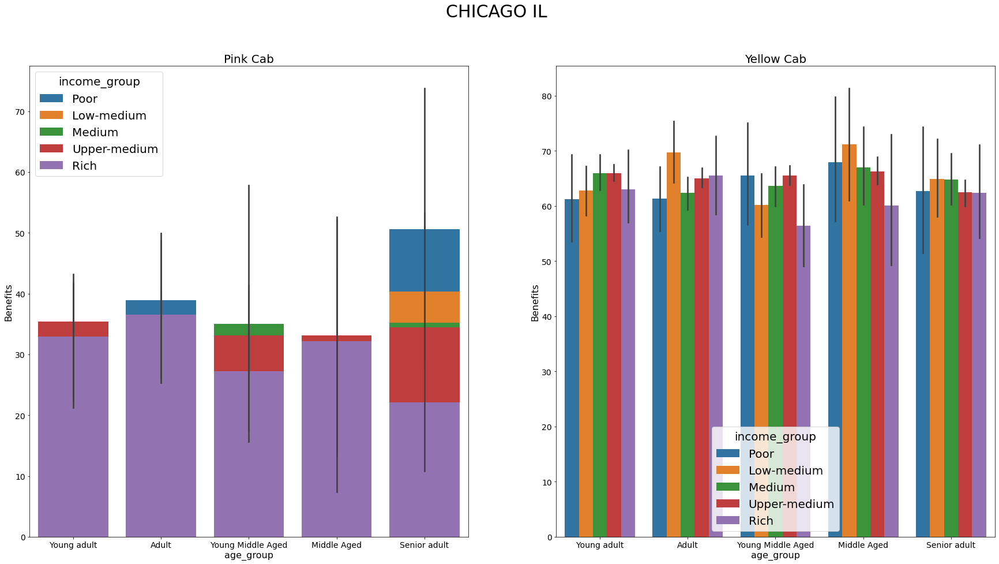

<Figure size 2160x1080 with 0 Axes>

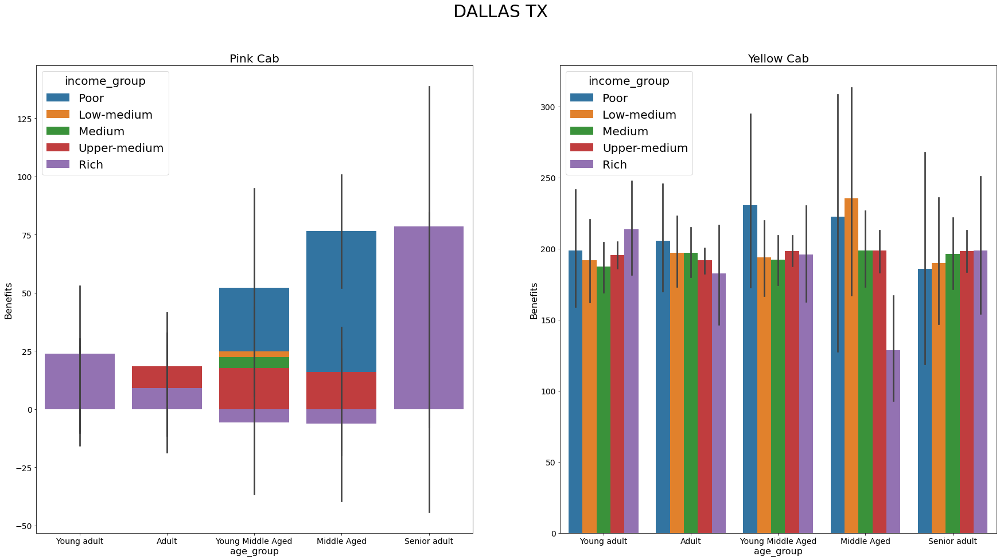

<Figure size 2160x1080 with 0 Axes>

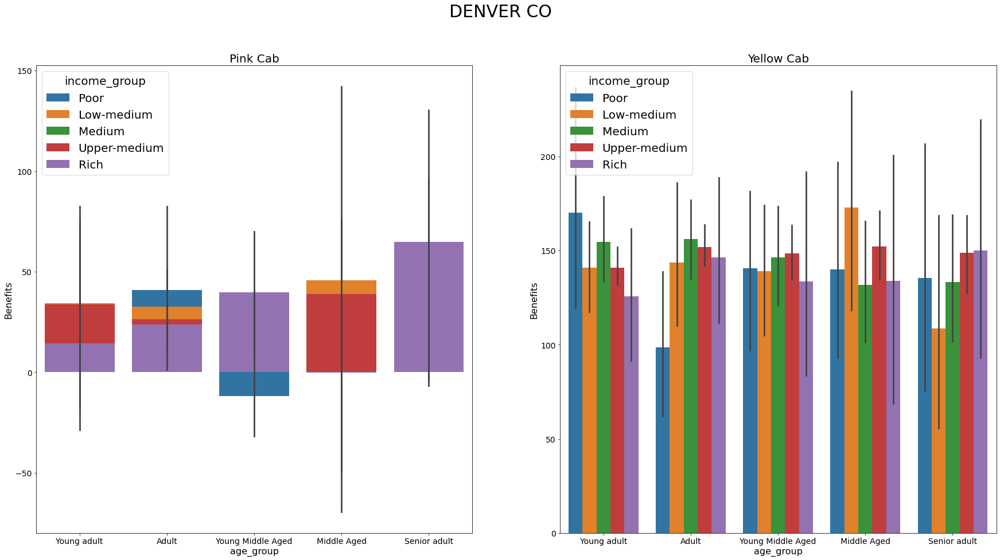

<Figure size 2160x1080 with 0 Axes>

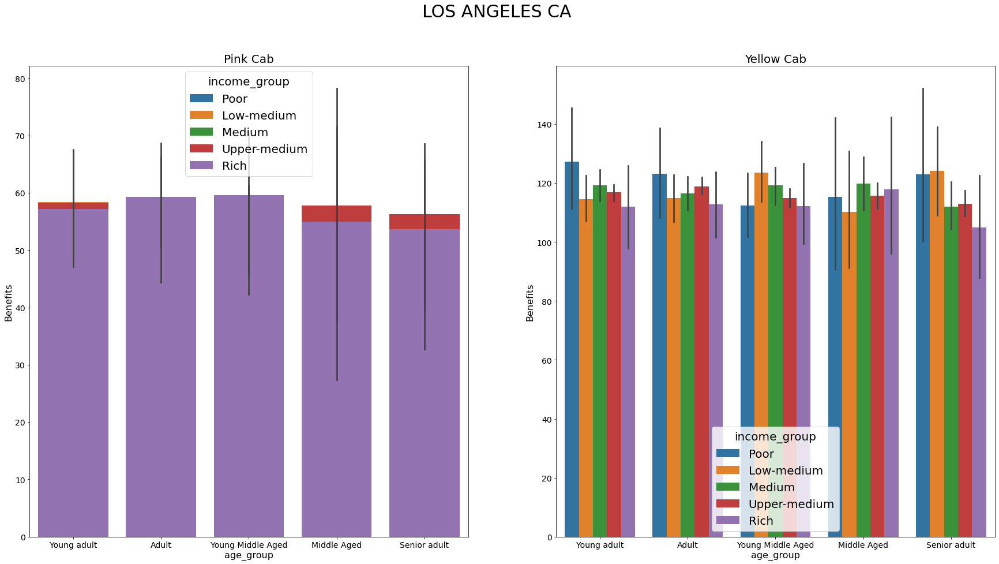

<Figure size 2160x1080 with 0 Axes>

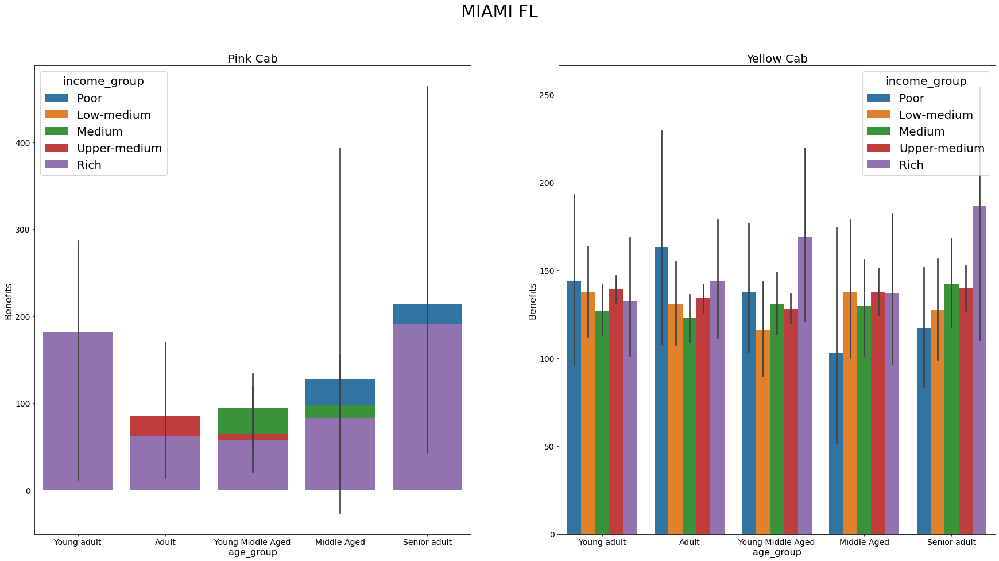

<Figure size 2160x1080 with 0 Axes>

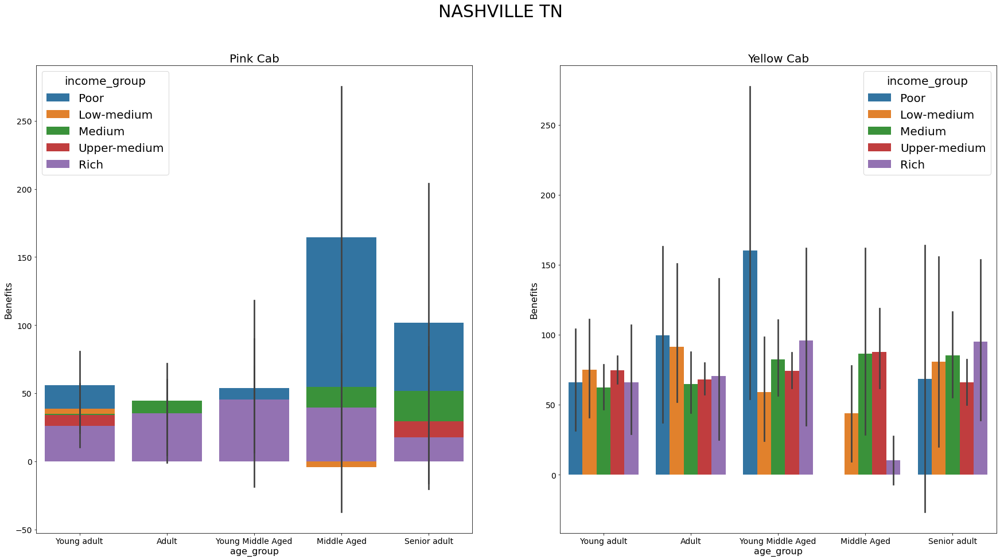

<Figure size 2160x1080 with 0 Axes>

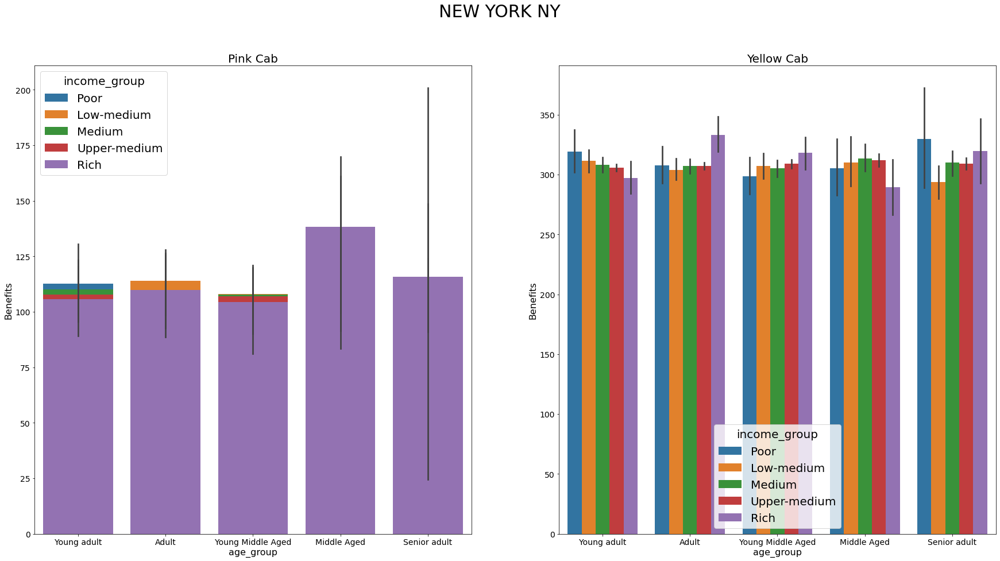

<Figure size 2160x1080 with 0 Axes>

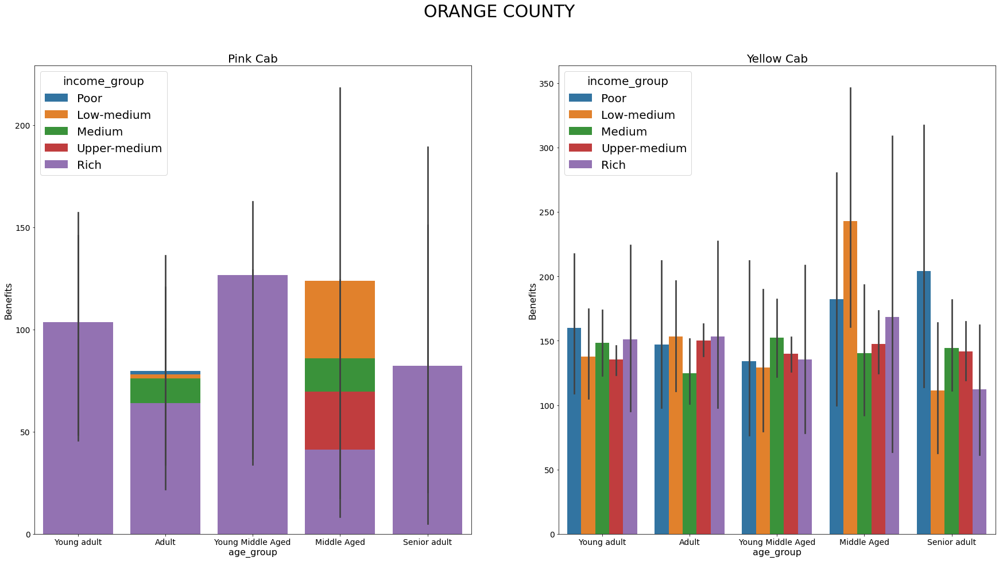

<Figure size 2160x1080 with 0 Axes>

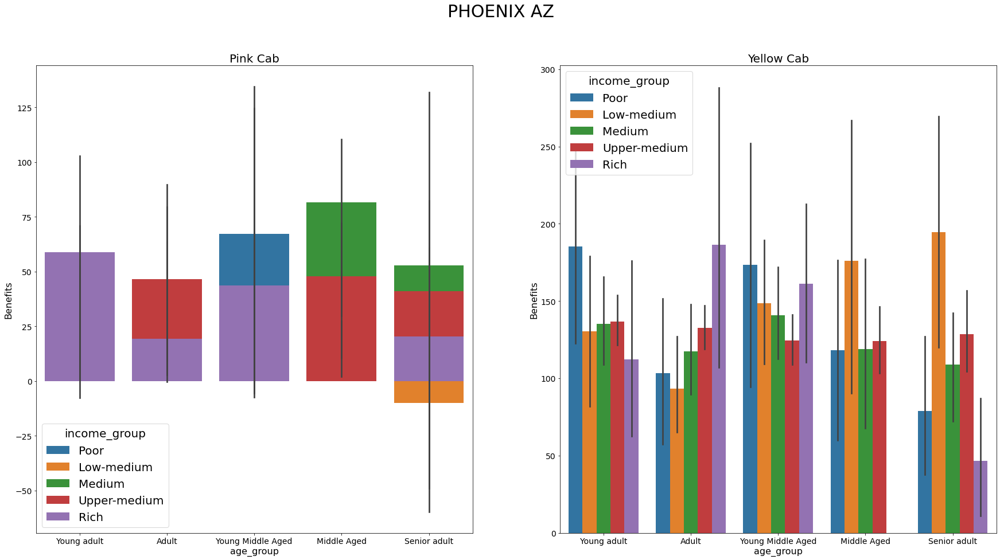

<Figure size 2160x1080 with 0 Axes>

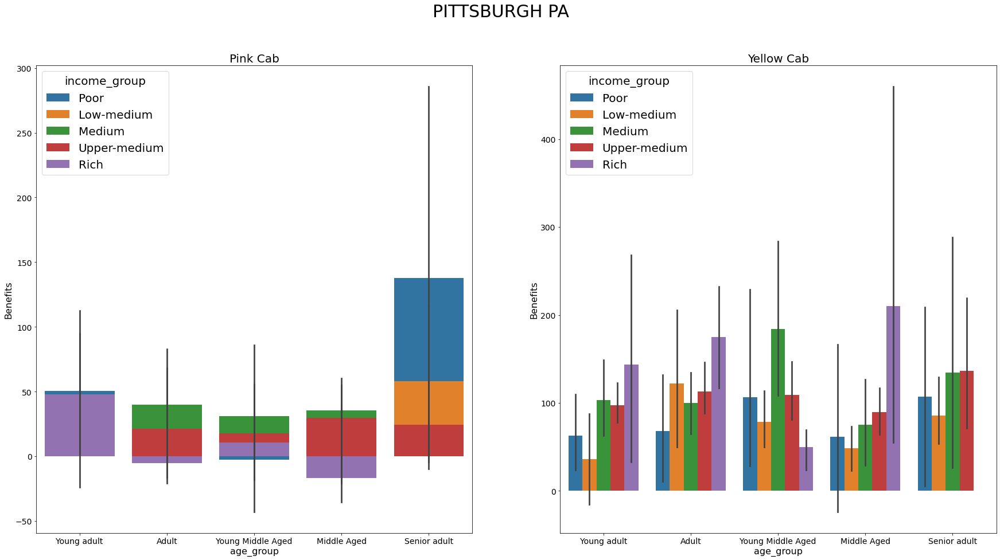

<Figure size 2160x1080 with 0 Axes>

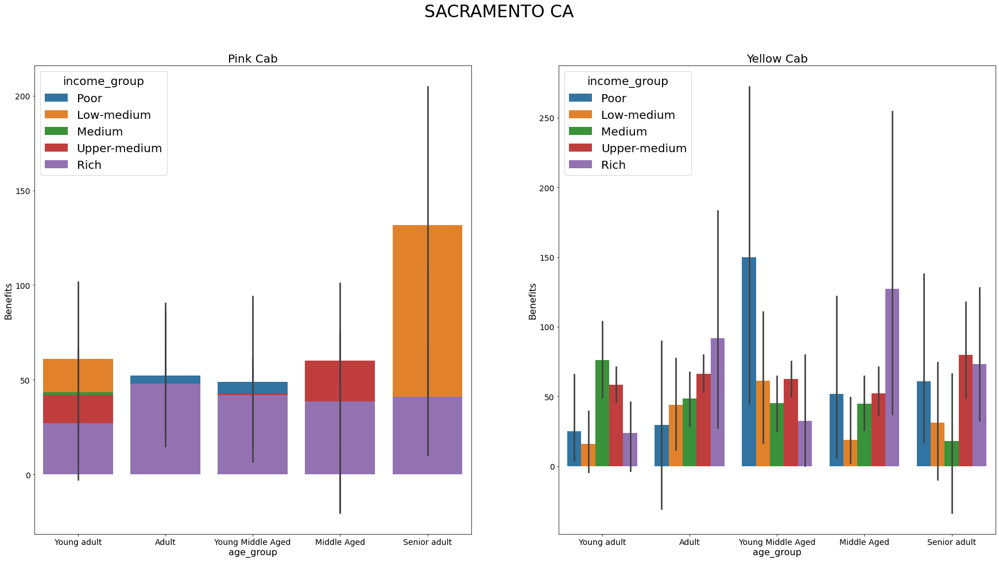

<Figure size 2160x1080 with 0 Axes>

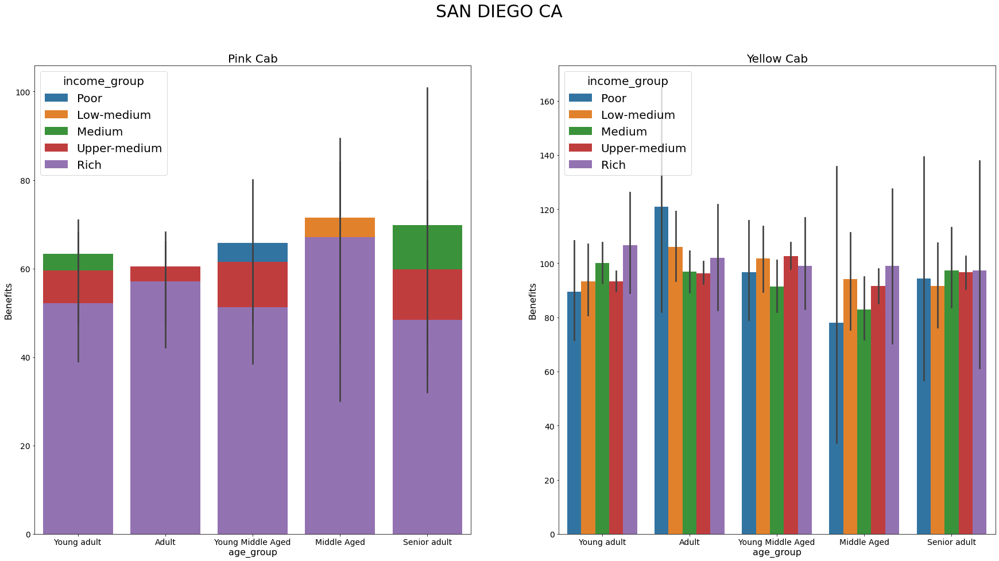

<Figure size 2160x1080 with 0 Axes>

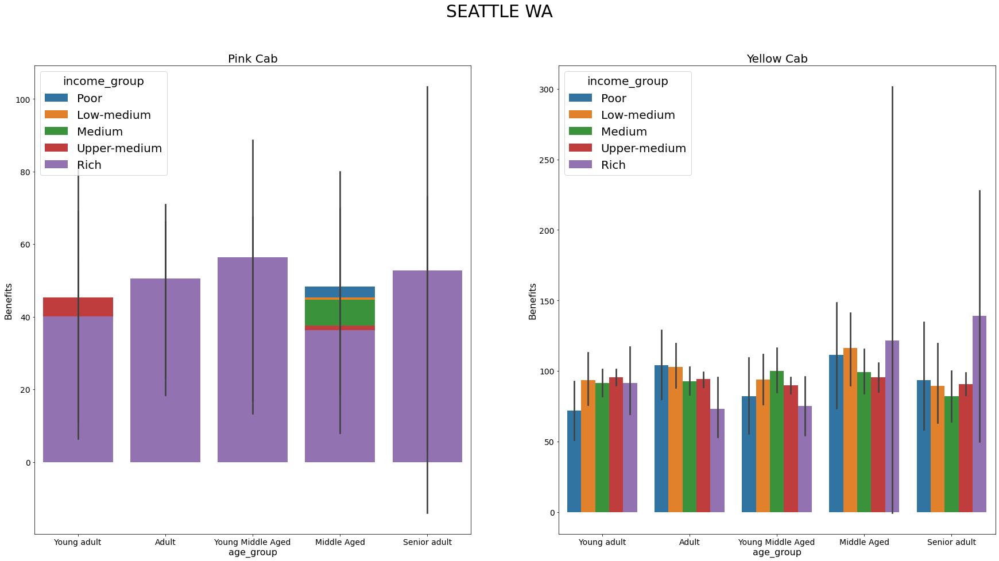

<Figure size 2160x1080 with 0 Axes>

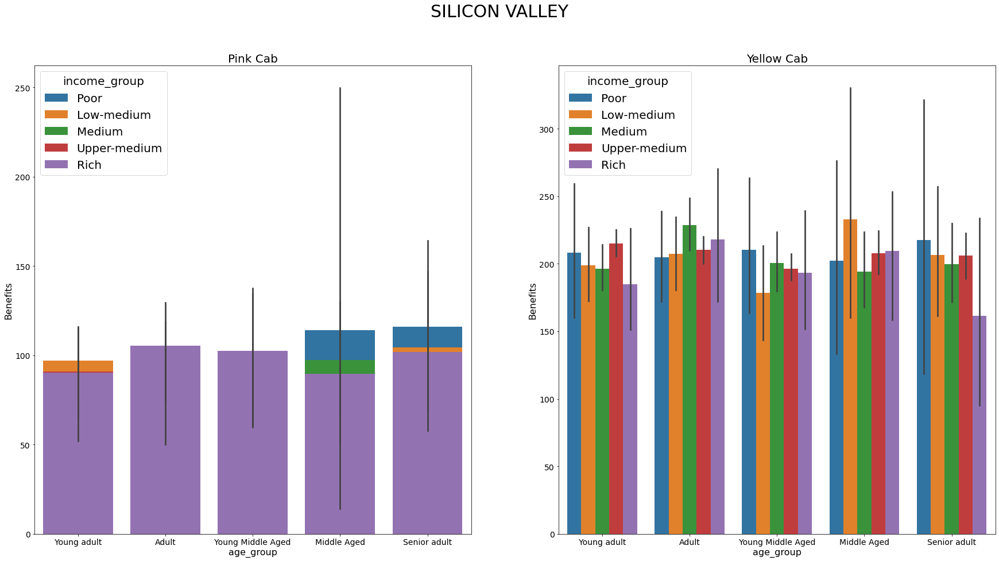

<Figure size 2160x1080 with 0 Axes>

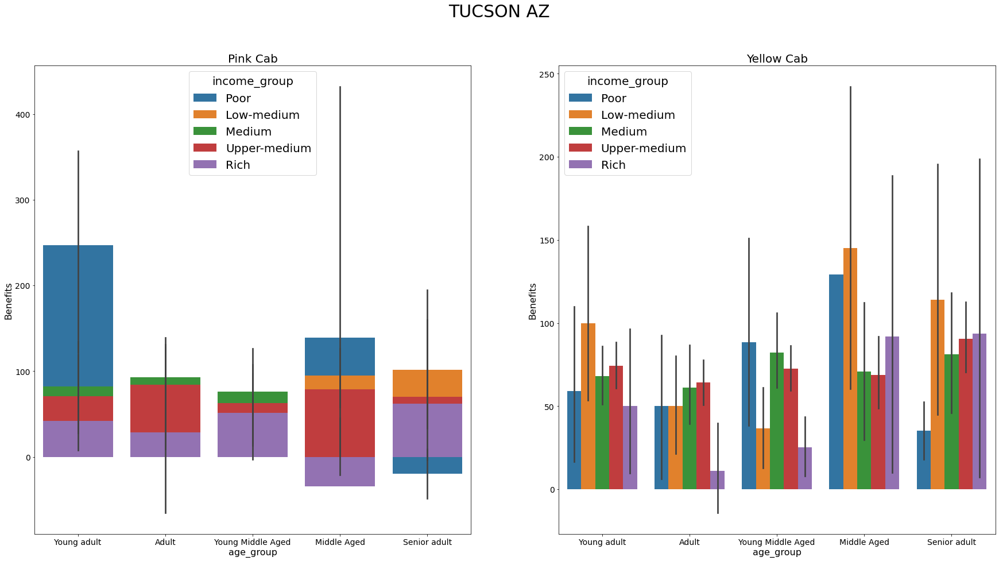

<Figure size 2160x1080 with 0 Axes>

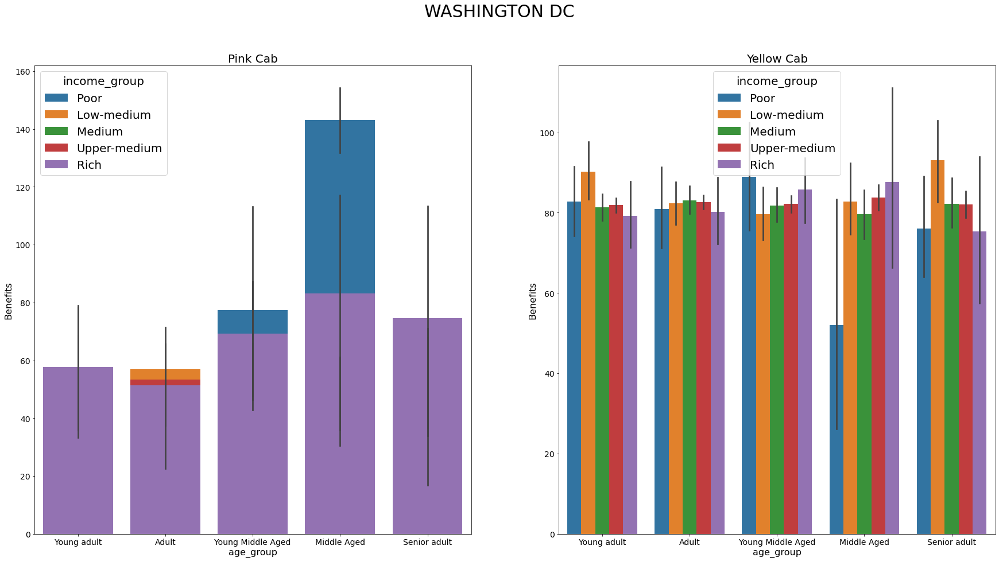

<Figure size 2160x1080 with 0 Axes>

In [73]:

#fig.suptitle("Income group and age group per city")

for i,city_now in enumerate(df_Merged["City"].unique()):
    fig,axes=plt.subplots(1,2)
    fig.suptitle(city_now,fontsize=30)
    sb.barplot(data=df_Merged.where(df_Merged["City"]==city_now).where(df_Merged["Company"]=="Pink Cab").dropna(),
    x="age_group",y="Benefits",hue="income_group",ax=axes[0])
    axes[0].set_title("Pink Cab")
    #Now it should be for yellow cab
    sb.barplot(data=df_Merged.where(df_Merged["City"]==city_now).where(df_Merged["Company"]=="Yellow Cab").dropna(),
    x="age_group",y="Benefits",hue="income_group",ax=axes[1])
    axes[1].set_title("Yellow Cab")
    plt.show()
    plt.clf();

Here we find a great surprise and is that the youngest, despite being the main users of the Cabs are not allways the mayor benefactor and that the rich client does not give always benefits by aberage.

# Conclusion

The main conclusion is that the yellow Cab seems to be the company that provides higher benefits, this is probably because it provides better quality and service than the competition. We can know this because, despite having a dataframe with an even number of clients that have used both companies, most of the clients want to use it again. By average, both companies seem to win the same per trip. So the yellow company choosed that the best way to earn more is to increase the number of loyal clients.

With all of this it is clear that the best company to invest is the Yellow Cab.